# 

In [1]:
import torch
import ray
import sys, os
from typing import Optional, Union, List
import multiprocessing
import numpy as np
import faiss
import mdtraj as md
import matplotlib.pyplot as plt
from seaborn import kdeplot

from writhe_tools.md_tools import (traj_slice, Rg, ResidueDistances,
                                   calc_sa, tangent_corr, bending_energy,
                                   get_residues, to_distance_matrix, to_contacts)

from writhe_tools.md_tools import curvature_menger as curvature
from writhe_tools.utils import lsdir, load_dict, combinations, save_dict, load_dict, group_by, reindex_list, Timer
from writhe_tools.writhe import Writhe, window_average, to_laplacian
from writhe_tools.plots import (subplots_proj2d, subplots_fes2d, lineplot1D,
                                box_plot, plot_distance_matrix, build_matrix_boxplot_grid,
                                build_grid_plot, annotated_matrix_plot)
from writhe_tools.tcca import tCCA
from writhe_tools.stats import pca, standardize, get_extrema, MaxEntropyReweight, std, mean



trajs_all = ["/data/r1r2/kaush/ab40/Ab40-a99SBdisp-Traj.dcd",
         "/data/top_complexity/calvados2_ensembles/Ab40/Ab40_converted.xtc",
         "/data/top_complexity/bAIes/traj_Ab40_bAIes.xtc",
         "/data/top_complexity/bioemu_ensembles/Ab40/samples_ready.xtc",
        "/data/top_complexity/starling/ab40/ab40_starling_all.xtc"
            
        ]
trajs = ["/data/r1r2/kaush/ab40/Ab40-a99SBdisp-Traj.dcd",
         "/data/top_complexity/calvados2_ensembles/Ab40/Ab40.dcd",
         "/data/top_complexity/bAIes/traj_Ab40_bAIes.xtc",
         "/data/top_complexity/bioemu_ensembles/Ab40/samples.xtc",
         "/data/top_complexity/starling/ab40/ab40_starling.xtc"
        ]
pdbs_all = ["/data/r1r2/kaush/ab40/Ab40.pdb",
            "/data/top_complexity/calvados2_ensembles/Ab40/Ab40_converted.pdb",
            "/data/top_complexity/bAIes/Ab40.pdb",
            "/data/top_complexity/bioemu_ensembles/Ab40/topology_ready.pdb",
            "/data/top_complexity/starling/ab40/ab40_starling_all.pdb"
        ]

pdbs = ["/data/r1r2/kaush/ab40/Ab40.pdb",
        "/data/top_complexity/calvados2_ensembles/Ab40/top.pdb",
        "/data/top_complexity/bAIes/Ab40.pdb",
        "/data/top_complexity/bioemu_ensembles/Ab40/topology.pdb",
        "/data/top_complexity/starling/ab40/ab40_starling.pdb"
        ]

helix_pdb = '/data/r1r2/kaush/ab40/Ab40_helix.pdb'
obs_path = '/data/top_complexity/observables/ab40'
exp_cs_file = '/data/top_complexity/observables/ab40/exp_cs.dat'


names = ['a99', 'calvados', 'bayes', 'bioemu', 'starling']
labels = ['a99SB-disp', 'CALVADOS', 'bAIes', 'bioemu', 'STARLING']
need_slice = [True, False, True, True, False]
colors = ['steelblue', 'orange','olivedrab', 'indianred', 'gray']


# for traj, pdb, slice_, label in zip(trajs_all, pdbs_all, need_slice, labels):
#     t = md.load(traj, top=pdb)
#     print(t)



/home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/mdtraj/geometry/order.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import parse_version
/home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED


[writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric)
[writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph]


In [4]:
from writhe_tools.utils import num_str
rm_index = lambda x : np.array(list(map(partial(num_str, reverse=True), x)))
seq, idx = get_residues(md.load(pdbs_all[0]))
''.join(list(np.array(list(iter(md.load(pdbs_all[0]).top.to_fasta()[0])))[idx]))

## Compute chemical shift predictions and save (don't re-run!)

In [47]:
from tools import prepare_sparta_path, parallel_chemical_shifts

prepare_sparta_path()
for index, name in enumerate(names):
    traj = md.load(trajs_all[index], top=pdbs_all[index])
    result = parallel_chemical_shifts(traj)
    save_dict(f'{obs_path}/{name}_cs.pkl', result)

## Load chemical shift predictions and align to available experimental data 

In [56]:
import numpy as np

def ci_filter(x, ci: float = 0.99, *, return_mask: bool = False, return_bounds: bool = False):
    """
    Keep only samples that fall inside the central empirical CI along the sample axis (n).

    Works for:
      - x.shape == (n,)    -> keeps values within [lo, hi]
      - x.shape == (n, d)  -> keeps rows whose *each* component lies within that component's [lo_j, hi_j]

    Parameters
    ----------
    x : array-like, shape (n,) or (n, d)
        Data.
    ci : float
        CI level in (0, 1), e.g. 0.95 for central 95%.
    return_mask : bool
        If True, also return a boolean mask of kept samples (shape (n,)).
    return_bounds : bool
        If True, also return (lo, hi) bounds. For (n,d) these are shape (d,).

    Returns
    -------
    x_in : np.ndarray
        Filtered values (shape (m,) or (m,d)).
    (optional) mask : np.ndarray[bool]
        True where sample is kept (shape (n,)).
    (optional) (lo, hi) : tuple
        Empirical CI bounds (scalars for (n,), arrays shape (d,) for (n,d)).
    """
    x = np.asarray(x)

    if not (0.0 < ci < 1.0):
        raise ValueError("ci must be in (0, 1).")

    if x.ndim == 1:
        # (n,)
        finite = np.isfinite(x)
        xf = x[finite]
        if xf.size == 0:
            out = np.array([], dtype=x.dtype)
            if return_mask and return_bounds:
                return out, np.zeros_like(x, dtype=bool), (np.nan, np.nan)
            if return_mask:
                return out, np.zeros_like(x, dtype=bool)
            if return_bounds:
                return out, (np.nan, np.nan)
            return out

        alpha = 0.5 * (1.0 - ci)
        lo, hi = np.quantile(xf, [alpha, 1.0 - alpha])

        mask = finite & (x >= lo) & (x <= hi)
        x_in = x[mask]

        if return_mask and return_bounds:
            return x_in, mask, (lo, hi)
        if return_mask:
            return x_in, mask
        if return_bounds:
            return x_in, (lo, hi)
        return x_in

    if x.ndim == 2:
        # (n, d) ; sample axis is 0
        finite_rows = np.isfinite(x).all(axis=1)
        xf = x[finite_rows]
        if xf.shape[0] == 0:
            out = np.empty((0, x.shape[1]), dtype=x.dtype)
            if return_mask and return_bounds:
                return out, np.zeros(x.shape[0], dtype=bool), (np.full(x.shape[1], np.nan), np.full(x.shape[1], np.nan))
            if return_mask:
                return out, np.zeros(x.shape[0], dtype=bool)
            if return_bounds:
                return out, (np.full(x.shape[1], np.nan), np.full(x.shape[1], np.nan))
            return out

        alpha = 0.5 * (1.0 - ci)
        lo = np.quantile(xf, alpha, axis=0)         # (d,)
        hi = np.quantile(xf, 1.0 - alpha, axis=0)   # (d,)

        within = (x >= lo) & (x <= hi)              # broadcast to (n, d)
        mask = finite_rows & within.all(axis=1)     # keep row if all dims inside
        x_in = x[mask]

        if return_mask and return_bounds:
            return x_in, mask, (lo, hi)
        if return_mask:
            return x_in, mask
        if return_bounds:
            return x_in, (lo, hi)
        return x_in

    raise ValueError(f"x must have shape (n,) or (n,d); got x.ndim={x.ndim} with shape {x.shape}.")


In [2]:
from tools import proc_exp_data, proc_forward_data, filter_observables
# get the raw experimental data
exp = proc_exp_data(exp_cs_file)
# load + filter the forward model predictions
forwards = [filter_observables(proc_forward_data(obs_path, i), exp)[0] for i in range(5)]
# filter the experimental data
exp  = filter_observables(forwards[0], exp)[-1]


/home/t/writhe/Writhe_Package_Lite/src/writhe_tools/utils/sorting.py:79: UserWarning: Not all strings contain a number, returning unsorted input list to avoid throwing an error. If you want to only consider strings that contain a digit, set indexed to True 
  warnings.warn("Not all strings contain a number, returning unsorted input list to avoid throwing an error. "


 # plot each (time) series of chemical shifts (though not all datasets give a continuous time series). Experimental value is shown as solid black line

In [63]:
def get_minmax(exp, forwards, obs_index):
    mins, maxes = [], []
    indices = np.arange(len(exp[1][obs_index]))
    for index in indices:
        mn, mx = np.inf, -np.inf
        for f in forwards:
            d = ci_filter(f[1][obs_index][index])
            mn = min(mn, d.min())
            mx = max(mx, d.max())
        mins.append(mn)
        maxes.append(mx)
    return mins, maxes
            
    
    

/tmp/ipykernel_23150/3062747615.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(4 if len(exp[1][obs_index]) <= 32 else 5, 8,


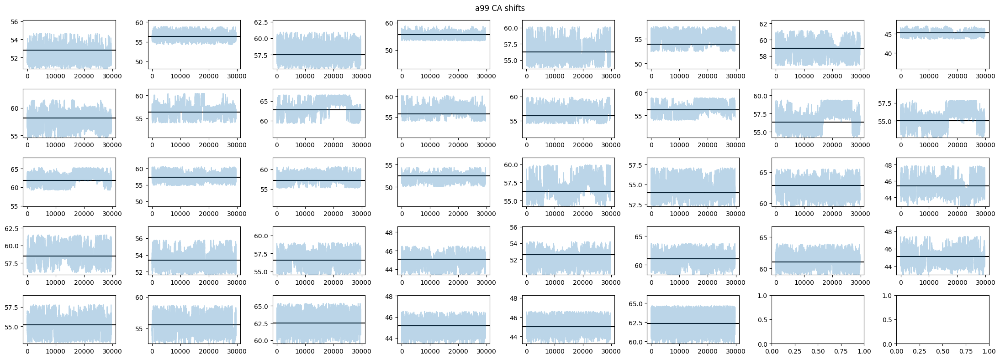

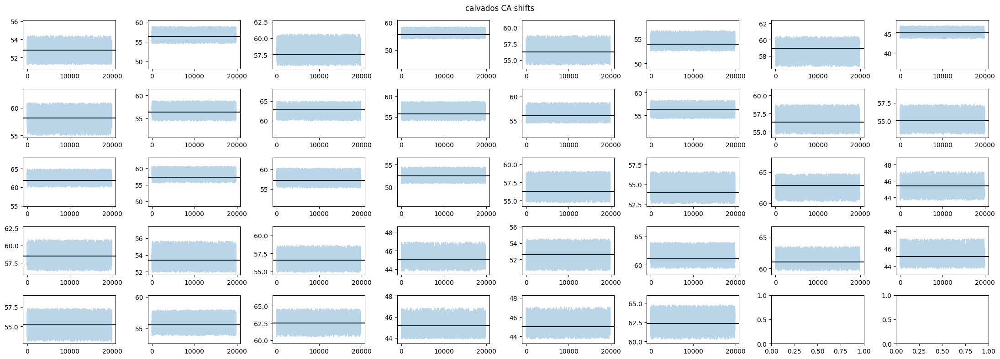

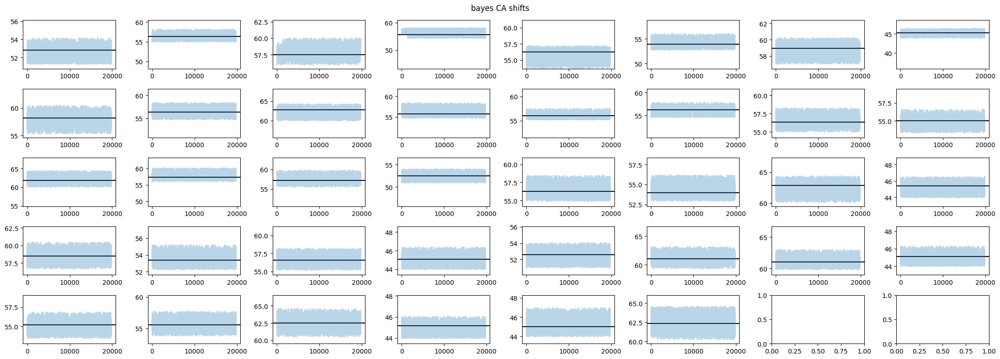

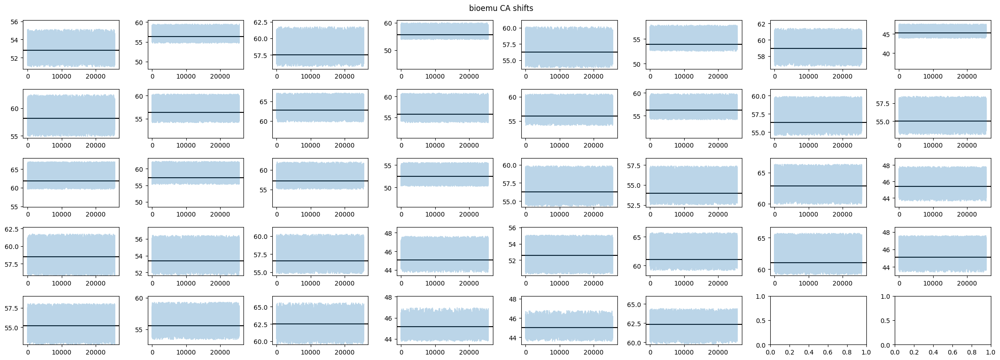

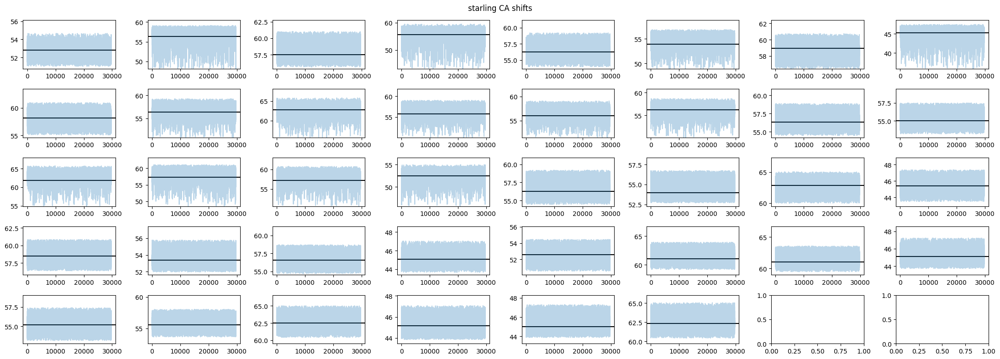

...

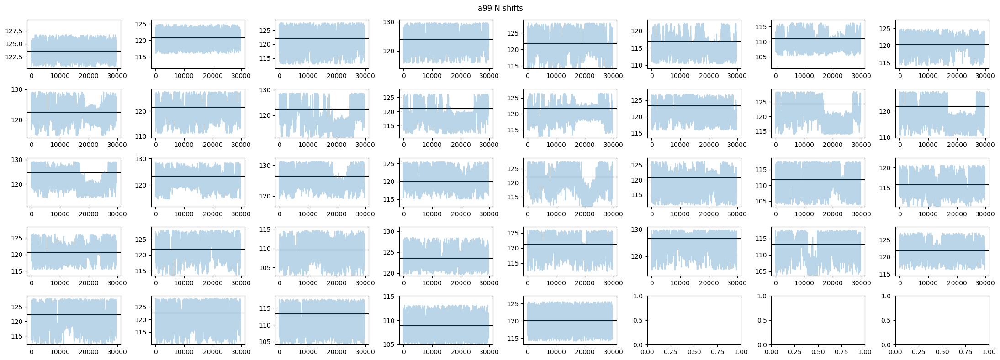

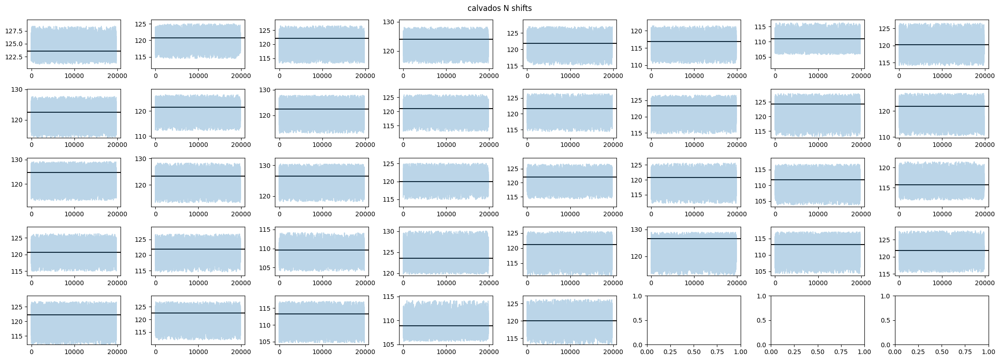

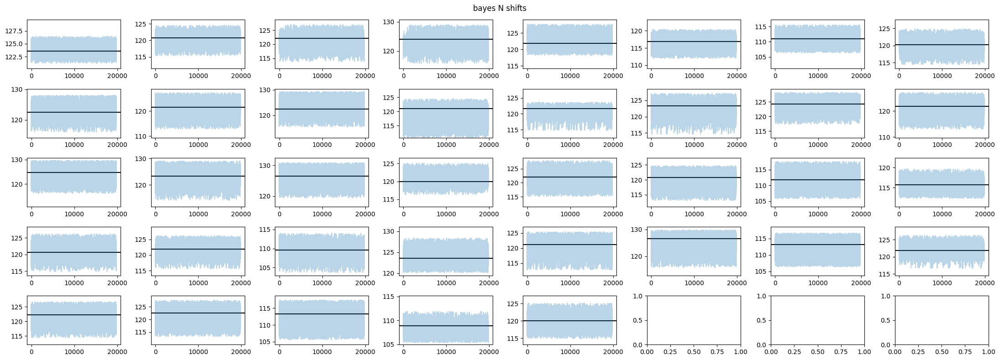

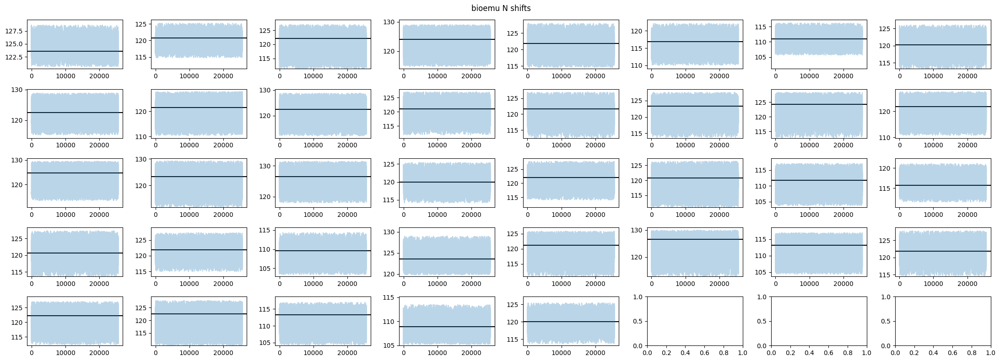

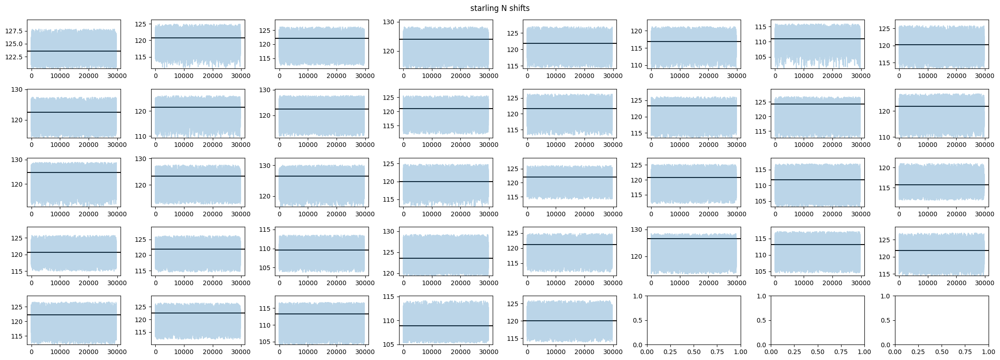

In [66]:
for obs_index, obs in enumerate(exp[0]):

    mins, maxes = get_minmax(exp, forwards, obs_index)

    
    for index, name in enumerate(names):
    
        fig, axes = plt.subplots(4 if len(exp[1][obs_index]) <= 32 else 5, 8,
                                 figsize=(22, 6 if len(exp[1][obs_index]) <= 32 else 8))
        
        fig.suptitle(f"{name} {obs} shifts")

        
        for j, k, min_, max_, ax in zip(forwards[index][1][obs_index], exp[1][obs_index], mins, maxes, axes.flat):
            ax.axhline(y=k, color='black', ls='-')
            ax.plot(ci_filter(j), alpha=.3)
            ax.set_ylim(min_, max_+1)
        fig.tight_layout()
            
            


/tmp/ipykernel_23150/3237808828.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(4 if len(exp[1][obs_index]) <= 32 else 5, 8,


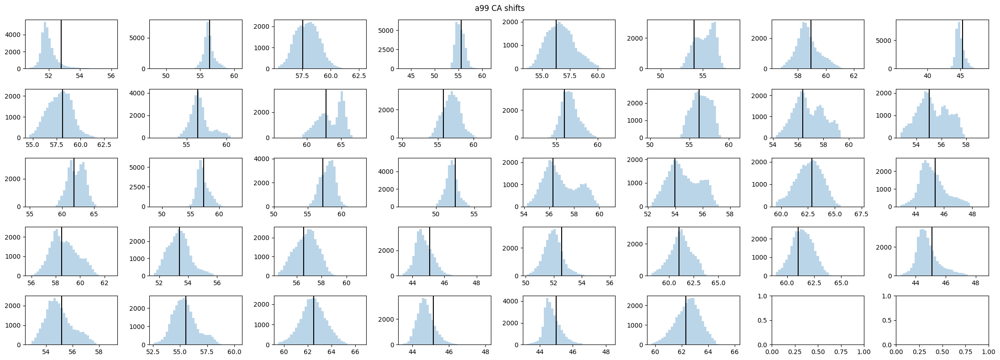

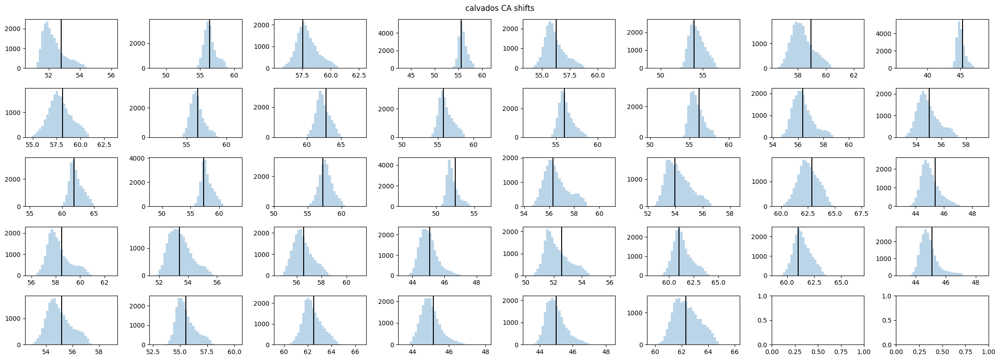

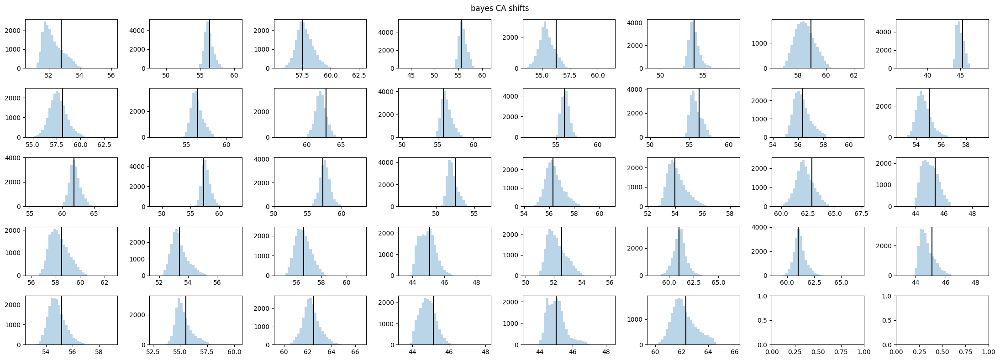

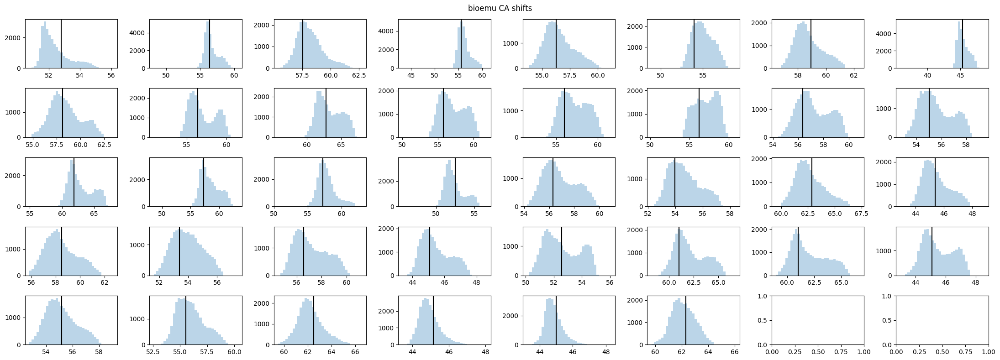

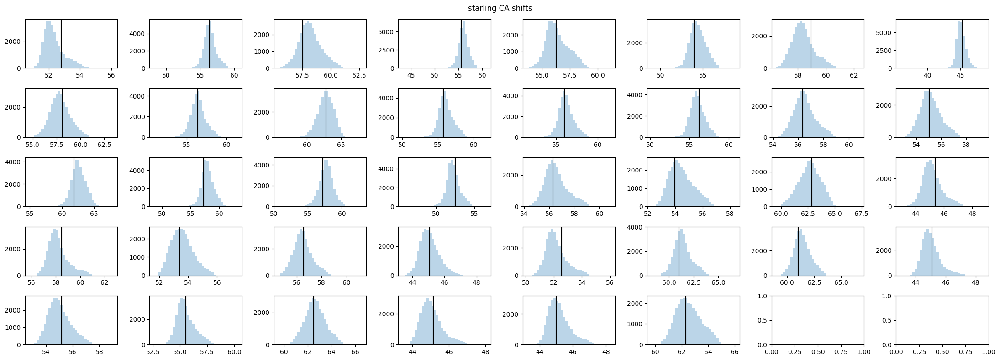

...

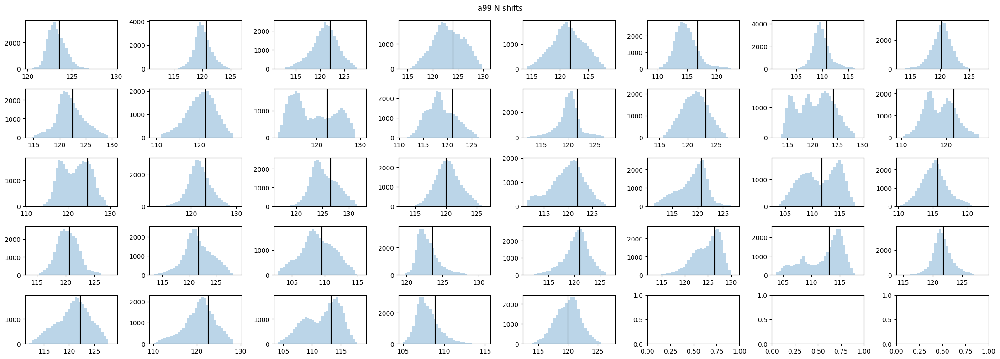

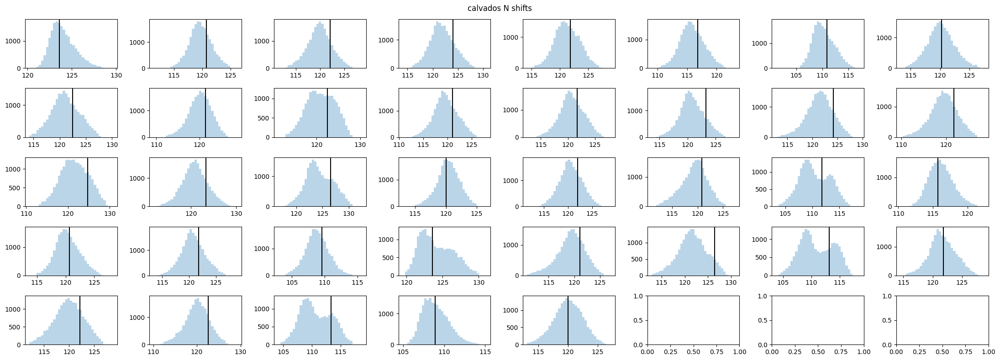

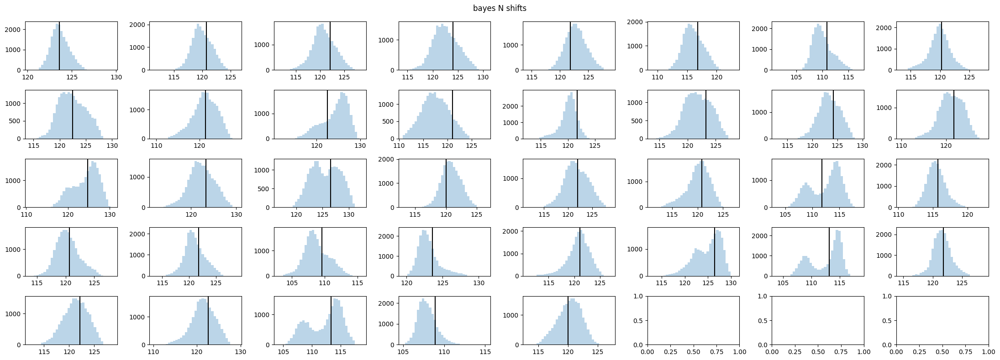

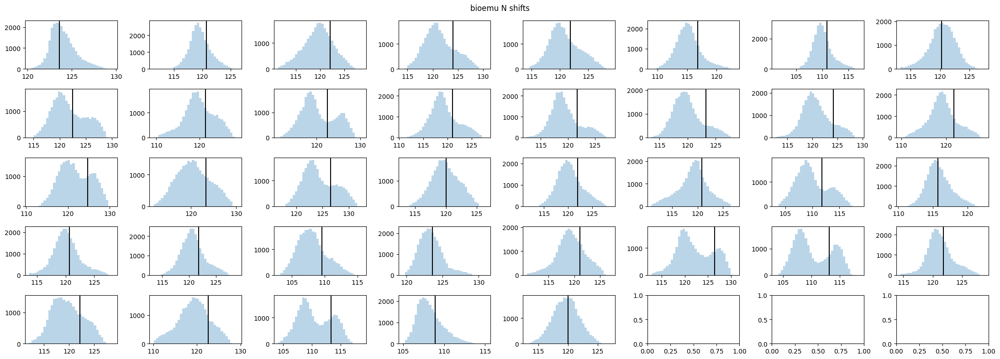

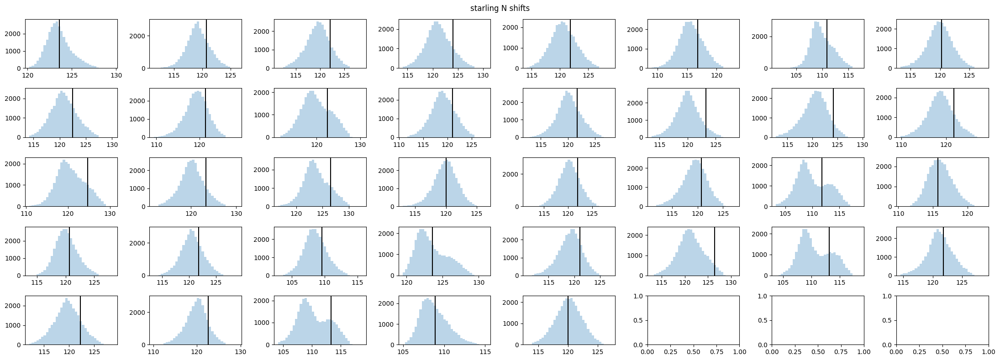

In [68]:
for obs_index, obs in enumerate(exp[0]):
    mins, maxes = get_minmax(exp, forwards, obs_index)
    for index, name in enumerate(names):
    
        fig, axes = plt.subplots(4 if len(exp[1][obs_index]) <= 32 else 5, 8,
                                 figsize=(22, 6 if len(exp[1][obs_index]) <= 32 else 8))
        
        fig.suptitle(f"{name} {obs} shifts")
        
        for j, k, min_, max_, ax in zip(forwards[index][1][obs_index], exp[1][obs_index], mins, maxes, axes.flat):
            ax.axvline(k, color='black', ls='-')
            ax.hist(ci_filter(j), alpha=.3, bins=35, range=(min_, max_+1))
        fig.tight_layout()

fig, axes = plt.subplots(2, 3, figsize=(9, 4.5))
for j, (m, ax, obs) in enumerate(zip((2.5, 2.5, 1.8, .8, 5), axes.flat, exp[0])):
    rms = [np.power(exp[1][j].reshape(-1, 1) - f[1][j], 2).mean(0) ** (1 / 2) for f in forwards]
    plt.figure(figsize=(4, 2))
    for i, c, label in zip(rms, colors, labels):
        ax.hist(i, color=c, bins=100, range=(0.1, m), histtype='step', label=label)
    ax.set_title(obs)
    ax.set_xlabel('RMSE')
    if j == 2:
        ax.legend(bbox_to_anchor=[1, 1])
fig.suptitle('RMSD Distributions from Experiment')
fig.tight_layout()

## Define some helper functions to partition the observables and data from different models

In [19]:
split_sample = np.cumsum(np.array([i[1][0].shape[-1] for i in forwards]))[:-1]
sample_split = lambda x : np.array_split(x, split_sample)

sample_labels = np.concatenate([np.ones(len(i[1][0].T)) * j for j, i in enumerate(forwards)])

split_value = np.cumsum(np.array([len(i) for i in forwards[1][1]]))[:-1]
value_split = lambda x : np.array_split(x, split_value)

reweight_indices = value_split(np.arange(sum(len(i) for i in exp[1])))

for f in forwards:
    for h in f[1]:
        print(h.shape)
    print('\n')

## Individual Reweighting

In [79]:
from tools import block_error, rmse
matrices = []
all_weights = []
kishes = [50, 40, 30, 20, 10, 5, 1]
for kish in kishes:
    rmses = []
    weight = []
    
    for i, f in enumerate(forwards):
        constraints = np.concatenate(f[1])
        rw = MaxEntropyReweight(constraints,
                                np.concatenate(exp[1]),
                                sigma_md = block_error(constraints.T)[1],
                                target_kish=kish
                             )
    
    
        rw.optimize_sigma_reg(reweight_indices,
                              global_steps=300,
                              standardize=False,
                              multi_proc=True,
                              #global_sigma_reg_u=20,
                              #global_steps=20,
                             )
        
        result = rw.reweight(True, standardize=False)
    
        rmses.append([rmse(i, j) for i, j in zip(value_split(result['weighted_mean']), value_split(rw.targets))])
    
        weight.append(result['weights'])
    
        print(result['kish'])
        
    matrices.append(np.stack(rmses, 1))
    all_weights.append(weight)


matrices = np.stack(matrices)
#weights = np.stack(weights)
    


2026-01-03 00:45:20,882	INFO worker.py:2012 -- Started a local Ray instance.


(pid=16368) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric)
(pid=16368) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph]


(pid=16369) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
(pid=16369)   from pandas.core.computation.check import NUMEXPR_INSTALLED


(pid=16373) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric) [repeated 4x across cluster]
(pid=16373) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph] [repeated 4x across cluster]


(pid=16370) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed). [repeated 4x across cluster]
(pid=16370)   from pandas.core.computation.check import NUMEXPR_INSTALLED [repeated 4x across cluster]


50.53761356698027


2026-01-03 00:45:38,520	INFO worker.py:2012 -- Started a local Ray instance.


(pid=18120) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric)
(pid=18120) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph]


(pid=18120) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
(pid=18120)   from pandas.core.computation.check import NUMEXPR_INSTALLED


(kish_scan_ pid=18128) Did not find optimal kish
(pid=18118) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric) [repeated 4x across cluster]
(pid=18118) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph] [repeated 4x across cluster]


(pid=18118) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed). [repeated 4x across cluster]
(pid=18118)   from pandas.core.computation.check import NUMEXPR_INSTALLED [repeated 4x across cluster]


20.963641751696372


2026-01-03 00:45:47,332	INFO worker.py:2012 -- Started a local Ray instance.


(pid=19875) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric)
(pid=19875) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph]


(pid=19879) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
(pid=19879)   from pandas.core.computation.check import NUMEXPR_INSTALLED


(pid=19879) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric) [repeated 4x across cluster]
(pid=19879) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph] [repeated 4x across cluster]


(pid=19878) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed). [repeated 4x across cluster]
(pid=19878)   from pandas.core.computation.check import NUMEXPR_INSTALLED [repeated 4x across cluster]


52.42669449565652


2026-01-03 00:45:59,583	INFO worker.py:2012 -- Started a local Ray instance.


(pid=21636) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric)
(pid=21636) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph]


(pid=21636) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
(pid=21636)   from pandas.core.computation.check import NUMEXPR_INSTALLED


(kish_scan_ pid=21637) Did not find optimal kish
(pid=21638) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric) [repeated 4x across cluster]
(pid=21638) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph] [repeated 4x across cluster]


(pid=21638) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed). [repeated 4x across cluster]
(pid=21638)   from pandas.core.computation.check import NUMEXPR_INSTALLED [repeated 4x across cluster]


11.207196131802892


2026-01-03 00:46:08,674	INFO worker.py:2012 -- Started a local Ray instance.


(pid=23480) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric)
(pid=23480) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph]


(pid=23480) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
(pid=23480)   from pandas.core.computation.check import NUMEXPR_INSTALLED


(pid=23479) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric) [repeated 4x across cluster]
(pid=23479) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph] [repeated 4x across cluster]


(pid=23479) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed). [repeated 4x across cluster]
(pid=23479)   from pandas.core.computation.check import NUMEXPR_INSTALLED [repeated 4x across cluster]


31.541414882970557


2026-01-03 00:46:21,834	INFO worker.py:2012 -- Started a local Ray instance.


(pid=25246) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric)
(pid=25246) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph]


(pid=25246) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
(pid=25246)   from pandas.core.computation.check import NUMEXPR_INSTALLED


(pid=25241) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric) [repeated 4x across cluster]
(pid=25241) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph] [repeated 4x across cluster]


(pid=25237) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed). [repeated 4x across cluster]
(pid=25237)   from pandas.core.computation.check import NUMEXPR_INSTALLED [repeated 4x across cluster]


41.80051661522332


2026-01-03 00:46:39,422	INFO worker.py:2012 -- Started a local Ray instance.


(pid=27103) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric)
(pid=27103) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph]


(pid=27099) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
(pid=27099)   from pandas.core.computation.check import NUMEXPR_INSTALLED


(kish_scan_ pid=27103) Did not find optimal kish
(pid=27105) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric) [repeated 4x across cluster]
(pid=27105) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph] [repeated 4x across cluster]


(pid=27105) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed). [repeated 4x across cluster]
(pid=27105)   from pandas.core.computation.check import NUMEXPR_INSTALLED [repeated 4x across cluster]


20.963641751696372


2026-01-03 00:46:48,231	INFO worker.py:2012 -- Started a local Ray instance.


(pid=28925) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric)
(pid=28925) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph]


(pid=28925) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
(pid=28925)   from pandas.core.computation.check import NUMEXPR_INSTALLED


(pid=28926) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric) [repeated 4x across cluster]
(pid=28926) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph] [repeated 4x across cluster]


(pid=28928) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed). [repeated 4x across cluster]
(pid=28928)   from pandas.core.computation.check import NUMEXPR_INSTALLED [repeated 4x across cluster]


41.37414974981631


2026-01-03 00:47:00,669	INFO worker.py:2012 -- Started a local Ray instance.


(pid=30693) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric)
(pid=30693) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph]


(pid=30696) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
(pid=30696)   from pandas.core.computation.check import NUMEXPR_INSTALLED


(kish_scan_ pid=30693) Did not find optimal kish
(pid=30695) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric) [repeated 4x across cluster]
(pid=30695) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph] [repeated 4x across cluster]


(pid=30695) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed). [repeated 4x across cluster]
(pid=30695)   from pandas.core.computation.check import NUMEXPR_INSTALLED [repeated 4x across cluster]


11.207196131802892


2026-01-03 00:47:09,739	INFO worker.py:2012 -- Started a local Ray instance.


(pid=32408) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric)
(pid=32408) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph]


(pid=32408) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
(pid=32408)   from pandas.core.computation.check import NUMEXPR_INSTALLED


(pid=32415) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric) [repeated 4x across cluster]
(pid=32415) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph] [repeated 4x across cluster]


(pid=32415) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed). [repeated 4x across cluster]
(pid=32415)   from pandas.core.computation.check import NUMEXPR_INSTALLED [repeated 4x across cluster]


31.541414882970557


2026-01-03 00:47:26,431	INFO worker.py:2012 -- Started a local Ray instance.


(pid=1842) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric)
(pid=1842) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph]


(pid=1842) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
(pid=1842)   from pandas.core.computation.check import NUMEXPR_INSTALLED


(pid=1847) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric) [repeated 4x across cluster]
(pid=1847) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph] [repeated 4x across cluster]


(pid=1848) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed). [repeated 4x across cluster]
(pid=1848)   from pandas.core.computation.check import NUMEXPR_INSTALLED [repeated 4x across cluster]


30.05132176542768


2026-01-03 00:47:45,020	INFO worker.py:2012 -- Started a local Ray instance.


(pid=4282) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric)
(pid=4282) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph]


(pid=4291) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
(pid=4291)   from pandas.core.computation.check import NUMEXPR_INSTALLED


(kish_scan_ pid=4288) Did not find optimal kish
(pid=4285) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric) [repeated 4x across cluster]
(pid=4285) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph] [repeated 4x across cluster]


(pid=4282) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed). [repeated 4x across cluster]
(pid=4282)   from pandas.core.computation.check import NUMEXPR_INSTALLED [repeated 4x across cluster]


20.963641751696372


2026-01-03 00:47:53,809	INFO worker.py:2012 -- Started a local Ray instance.


(pid=6038) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric)
(pid=6038) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph]


(pid=6038) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
(pid=6038)   from pandas.core.computation.check import NUMEXPR_INSTALLED


(pid=6042) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric) [repeated 4x across cluster]
(pid=6042) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph] [repeated 4x across cluster]


(pid=6047) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed). [repeated 4x across cluster]
(pid=6047)   from pandas.core.computation.check import NUMEXPR_INSTALLED [repeated 4x across cluster]


32.43703941260694


2026-01-03 00:48:06,217	INFO worker.py:2012 -- Started a local Ray instance.


(pid=7786) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric)
(pid=7786) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph]


(pid=7784) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
(pid=7784)   from pandas.core.computation.check import NUMEXPR_INSTALLED


(kish_scan_ pid=7787) Did not find optimal kish
(pid=7783) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric) [repeated 4x across cluster]
(pid=7783) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph] [repeated 4x across cluster]


(pid=7790) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed). [repeated 4x across cluster]
(pid=7790)   from pandas.core.computation.check import NUMEXPR_INSTALLED [repeated 4x across cluster]


11.207196131802892


2026-01-03 00:48:15,303	INFO worker.py:2012 -- Started a local Ray instance.


(pid=9514) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric)
(pid=9514) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph]


(pid=9514) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
(pid=9514)   from pandas.core.computation.check import NUMEXPR_INSTALLED


(pid=9524) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric) [repeated 4x across cluster]
(pid=9524) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph] [repeated 4x across cluster]


(pid=9521) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed). [repeated 4x across cluster]
(pid=9521)   from pandas.core.computation.check import NUMEXPR_INSTALLED [repeated 4x across cluster]


30.18891583271081


2026-01-03 00:50:50,934	INFO worker.py:2012 -- Started a local Ray instance.


(pid=11488) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric)
(pid=11488) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph]


(pid=11488) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
(pid=11488)   from pandas.core.computation.check import NUMEXPR_INSTALLED


(pid=11490) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric) [repeated 4x across cluster]
(pid=11490) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph] [repeated 4x across cluster]


(pid=11495) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed). [repeated 4x across cluster]
(pid=11495)   from pandas.core.computation.check import NUMEXPR_INSTALLED [repeated 4x across cluster]


20.082155854751296


2026-01-03 00:51:09,565	INFO worker.py:2012 -- Started a local Ray instance.


(pid=13268) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric)
(pid=13268) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph]


(pid=13268) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
(pid=13268)   from pandas.core.computation.check import NUMEXPR_INSTALLED


(pid=13274) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric) [repeated 4x across cluster]
(pid=13274) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph] [repeated 4x across cluster]


(pid=13274) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed). [repeated 4x across cluster]
(pid=13274)   from pandas.core.computation.check import NUMEXPR_INSTALLED [repeated 4x across cluster]


20.008357394548707


2026-01-03 00:52:20,624	INFO worker.py:2012 -- Started a local Ray instance.


(pid=15093) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric)
(pid=15093) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph]


(pid=15095) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
(pid=15095)   from pandas.core.computation.check import NUMEXPR_INSTALLED


(pid=15096) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric) [repeated 4x across cluster]
(pid=15096) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph] [repeated 4x across cluster]


(pid=15093) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed). [repeated 4x across cluster]
(pid=15093)   from pandas.core.computation.check import NUMEXPR_INSTALLED [repeated 4x across cluster]


20.791334949184154


2026-01-03 00:52:33,104	INFO worker.py:2012 -- Started a local Ray instance.


(pid=16872) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric)
(pid=16872) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph]


(pid=16875) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
(pid=16875)   from pandas.core.computation.check import NUMEXPR_INSTALLED


(kish_scan_ pid=16872) Did not find optimal kish
(pid=16881) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric) [repeated 4x across cluster]
(pid=16881) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph] [repeated 4x across cluster]


(pid=16881) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed). [repeated 4x across cluster]
(pid=16881)   from pandas.core.computation.check import NUMEXPR_INSTALLED [repeated 4x across cluster]


11.207196131802892


2026-01-03 00:52:42,177	INFO worker.py:2012 -- Started a local Ray instance.


(pid=18607) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric)
(pid=18607) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph]


(pid=18609) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
(pid=18609)   from pandas.core.computation.check import NUMEXPR_INSTALLED


(pid=18608) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric) [repeated 4x across cluster]
(pid=18608) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph] [repeated 4x across cluster]


(pid=18606) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed). [repeated 4x across cluster]
(pid=18606)   from pandas.core.computation.check import NUMEXPR_INSTALLED [repeated 4x across cluster]


20.098606734174737


2026-01-03 00:56:44,260	INFO worker.py:2012 -- Started a local Ray instance.


(pid=20592) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric)
(pid=20592) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph]


(pid=20595) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
(pid=20595)   from pandas.core.computation.check import NUMEXPR_INSTALLED


(pid=20595) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric) [repeated 4x across cluster]
(pid=20595) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph] [repeated 4x across cluster]


(pid=20594) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed). [repeated 4x across cluster]
(pid=20594)   from pandas.core.computation.check import NUMEXPR_INSTALLED [repeated 4x across cluster]


11.40098690872666


2026-01-03 00:57:02,726	INFO worker.py:2012 -- Started a local Ray instance.


(pid=22332) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric)
(pid=22332) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph]


(pid=22332) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
(pid=22332)   from pandas.core.computation.check import NUMEXPR_INSTALLED


(kish_scan_ pid=22336) Did not find optimal kish
(pid=22333) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric) [repeated 4x across cluster]
(pid=22333) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph] [repeated 4x across cluster]


(pid=22335) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed). [repeated 4x across cluster]
(pid=22335)   from pandas.core.computation.check import NUMEXPR_INSTALLED [repeated 4x across cluster]


10.327497111814308


2026-01-03 00:58:25,508	INFO worker.py:2012 -- Started a local Ray instance.


(pid=24256) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric)
(pid=24256) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph]


(pid=24256) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
(pid=24256)   from pandas.core.computation.check import NUMEXPR_INSTALLED


(pid=24267) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric) [repeated 4x across cluster]
(pid=24267) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph] [repeated 4x across cluster]


(pid=24267) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed). [repeated 4x across cluster]
(pid=24267)   from pandas.core.computation.check import NUMEXPR_INSTALLED [repeated 4x across cluster]


11.234656010370593


2026-01-03 00:58:37,691	INFO worker.py:2012 -- Started a local Ray instance.


(pid=25989) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric)
(pid=25989) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph]


(pid=25994) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
(pid=25994)   from pandas.core.computation.check import NUMEXPR_INSTALLED


(kish_scan_ pid=25987) Did not find optimal kish
(pid=25991) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric) [repeated 4x across cluster]
(pid=25991) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph] [repeated 4x across cluster]


(pid=25993) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed). [repeated 4x across cluster]
(pid=25993)   from pandas.core.computation.check import NUMEXPR_INSTALLED [repeated 4x across cluster]


10.077052240667149


2026-01-03 00:59:29,171	INFO worker.py:2012 -- Started a local Ray instance.


(pid=27924) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric)
(pid=27924) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph]


(pid=27924) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
(pid=27924)   from pandas.core.computation.check import NUMEXPR_INSTALLED


(pid=27935) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric) [repeated 4x across cluster]
(pid=27935) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph] [repeated 4x across cluster]


(pid=27928) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed). [repeated 4x across cluster]
(pid=27928)   from pandas.core.computation.check import NUMEXPR_INSTALLED [repeated 4x across cluster]


10.091498897986881


2026-01-03 01:03:49,853	INFO worker.py:2012 -- Started a local Ray instance.


(pid=29997) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric)
(pid=29997) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph]


(pid=29992) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
(pid=29992)   from pandas.core.computation.check import NUMEXPR_INSTALLED


(pid=29990) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric) [repeated 4x across cluster]
(pid=29990) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph] [repeated 4x across cluster]


(pid=29993) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed). [repeated 4x across cluster]
(pid=29993)   from pandas.core.computation.check import NUMEXPR_INSTALLED [repeated 4x across cluster]


5.392812670368152


2026-01-03 01:04:09,059	INFO worker.py:2012 -- Started a local Ray instance.


(pid=31746) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric)
(pid=31746) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph]


(pid=31747) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
(pid=31747)   from pandas.core.computation.check import NUMEXPR_INSTALLED


(kish_scan_ pid=31752) Did not find optimal kish
(pid=31751) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric) [repeated 4x across cluster]
(pid=31751) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph] [repeated 4x across cluster]


(pid=31749) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed). [repeated 4x across cluster]
(pid=31749)   from pandas.core.computation.check import NUMEXPR_INSTALLED [repeated 4x across cluster]


5.3452554373805405


2026-01-03 01:05:33,052	INFO worker.py:2012 -- Started a local Ray instance.


(pid=1185) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric)
(pid=1185) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph]


(pid=1185) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
(pid=1185)   from pandas.core.computation.check import NUMEXPR_INSTALLED


(pid=1194) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric) [repeated 4x across cluster]
(pid=1194) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph] [repeated 4x across cluster]


(pid=1194) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed). [repeated 4x across cluster]
(pid=1194)   from pandas.core.computation.check import NUMEXPR_INSTALLED [repeated 4x across cluster]


5.133452618116022


2026-01-03 01:05:45,781	INFO worker.py:2012 -- Started a local Ray instance.


(pid=3504) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric)
(pid=3504) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph]


(pid=3504) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
(pid=3504)   from pandas.core.computation.check import NUMEXPR_INSTALLED


(kish_scan_ pid=3508) Did not find optimal kish
(pid=3510) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric) [repeated 4x across cluster]
(pid=3510) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph] [repeated 4x across cluster]


(pid=3505) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed). [repeated 4x across cluster]
(pid=3505)   from pandas.core.computation.check import NUMEXPR_INSTALLED [repeated 4x across cluster]


5.3172084070398205


2026-01-03 01:06:38,811	INFO worker.py:2012 -- Started a local Ray instance.


(pid=5486) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric)
(pid=5486) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph]


(pid=5487) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
(pid=5487)   from pandas.core.computation.check import NUMEXPR_INSTALLED


(pid=5487) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric) [repeated 4x across cluster]
(pid=5487) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph] [repeated 4x across cluster]


(pid=5489) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed). [repeated 4x across cluster]
(pid=5489)   from pandas.core.computation.check import NUMEXPR_INSTALLED [repeated 4x across cluster]


5.1941428882342064


2026-01-03 01:11:16,514	INFO worker.py:2012 -- Started a local Ray instance.


(pid=7498) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric)
(pid=7498) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph]


(pid=7492) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
(pid=7492)   from pandas.core.computation.check import NUMEXPR_INSTALLED


(pid=7493) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric) [repeated 4x across cluster]
(pid=7493) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph] [repeated 4x across cluster]


(pid=7496) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed). [repeated 4x across cluster]
(pid=7496)   from pandas.core.computation.check import NUMEXPR_INSTALLED [repeated 4x across cluster]


1.0619622204817343


2026-01-03 01:11:36,407	INFO worker.py:2012 -- Started a local Ray instance.


(pid=9210) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric)
(pid=9210) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph]


(pid=9214) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
(pid=9214)   from pandas.core.computation.check import NUMEXPR_INSTALLED


(kish_scan_ pid=9218) Did not find optimal kish
(pid=9218) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric) [repeated 4x across cluster]
(pid=9218) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph] [repeated 4x across cluster]


(pid=9210) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed). [repeated 4x across cluster]
(pid=9210)   from pandas.core.computation.check import NUMEXPR_INSTALLED [repeated 4x across cluster]


1.0553586710695664


2026-01-03 01:13:04,072	INFO worker.py:2012 -- Started a local Ray instance.


(pid=11081) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric)
(pid=11081) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph]


(pid=11081) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
(pid=11081)   from pandas.core.computation.check import NUMEXPR_INSTALLED


(pid=11079) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric) [repeated 4x across cluster]
(pid=11079) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph] [repeated 4x across cluster]


(pid=11078) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed). [repeated 4x across cluster]
(pid=11078)   from pandas.core.computation.check import NUMEXPR_INSTALLED [repeated 4x across cluster]


1.1248589926557453


2026-01-03 01:13:17,201	INFO worker.py:2012 -- Started a local Ray instance.


(pid=12845) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric)
(pid=12845) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph]


(pid=12846) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
(pid=12846)   from pandas.core.computation.check import NUMEXPR_INSTALLED


(kish_scan_ pid=12843) Did not find optimal kish
(pid=12853) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric) [repeated 4x across cluster]
(pid=12853) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph] [repeated 4x across cluster]


(pid=12843) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed). [repeated 4x across cluster]
(pid=12843)   from pandas.core.computation.check import NUMEXPR_INSTALLED [repeated 4x across cluster]


1.0490570097559337


2026-01-03 01:14:12,182	INFO worker.py:2012 -- Started a local Ray instance.


(pid=14679) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric)
(pid=14679) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph]


(pid=14679) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
(pid=14679)   from pandas.core.computation.check import NUMEXPR_INSTALLED


(pid=14691) [writhe_tools] ⏭️ Skipping 'graph_utils' (missing: torch_geometric) [repeated 4x across cluster]
(pid=14691) [writhe_tools] 👉 To enable this module, install: pip install writhe-tools[graph] [repeated 4x across cluster]


(pid=14682) /home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed). [repeated 4x across cluster]
(pid=14682)   from pandas.core.computation.check import NUMEXPR_INSTALLED [repeated 4x across cluster]


1.0762019985366367


In [80]:
# grab weights for kish ~ 10
weights = all_weights[-1]

In [81]:
from writhe_tools.stats import compute_kish
[compute_kish(i) for i in weights]

[1.0619622204817343,
 1.0553586710695664,
 1.1248589926557453,
 1.0490570097559337,
 1.0762019985366367]

/tmp/ipykernel_23150/4061137136.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(4 if len(exp[1][obs_index]) <= 32 else 5, 8,


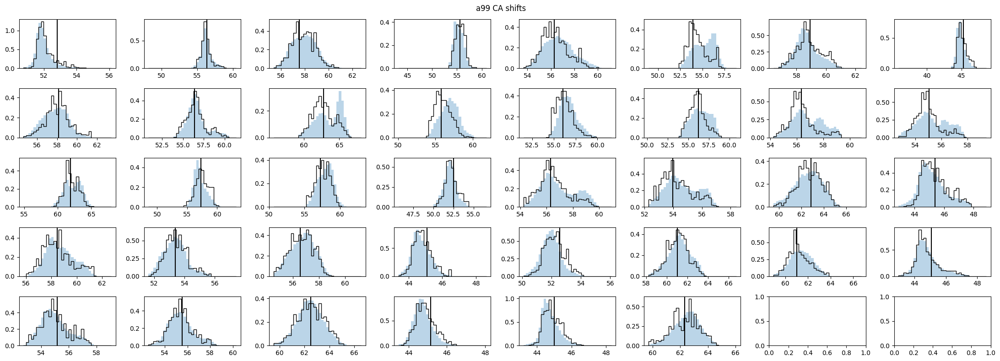

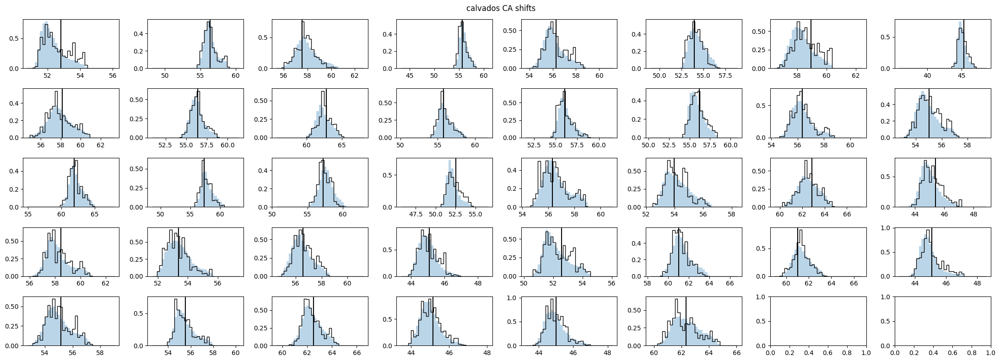

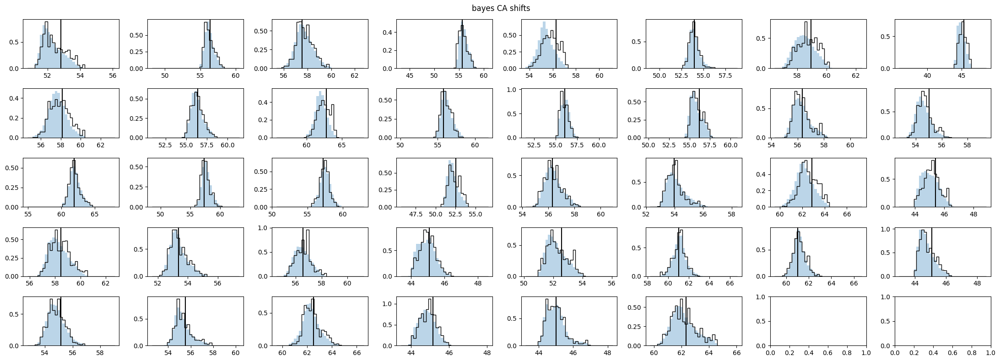

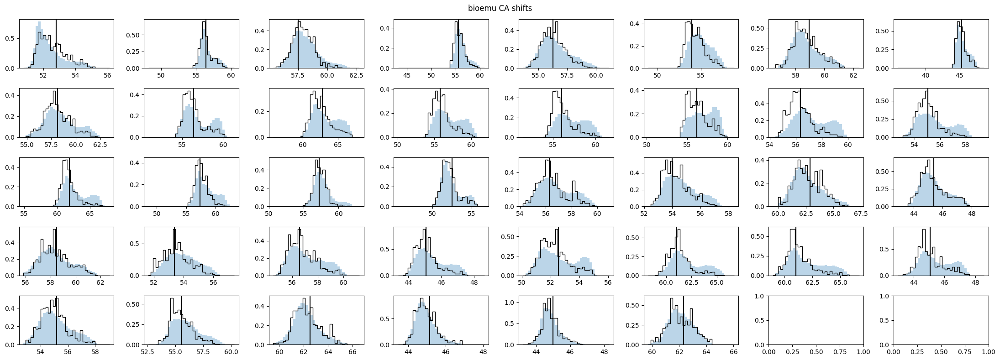

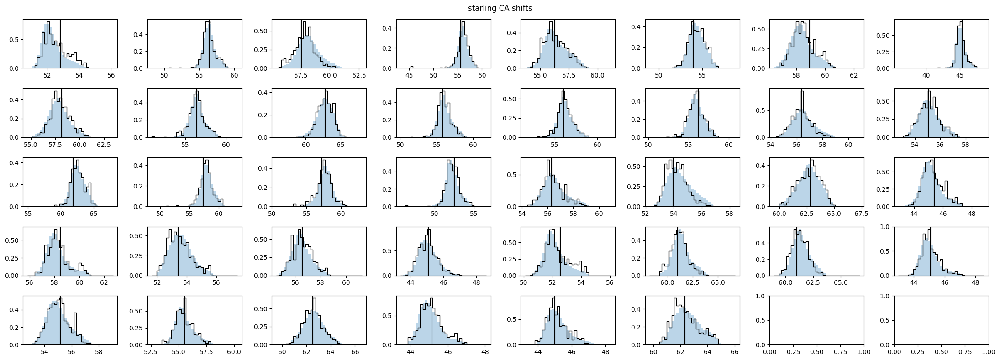

...

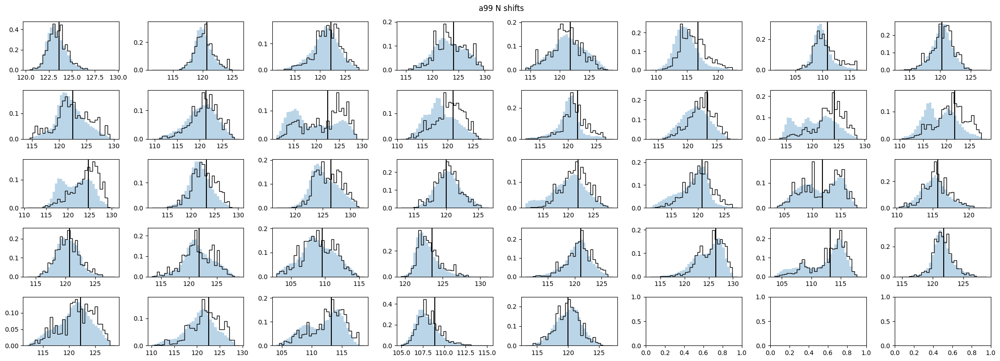

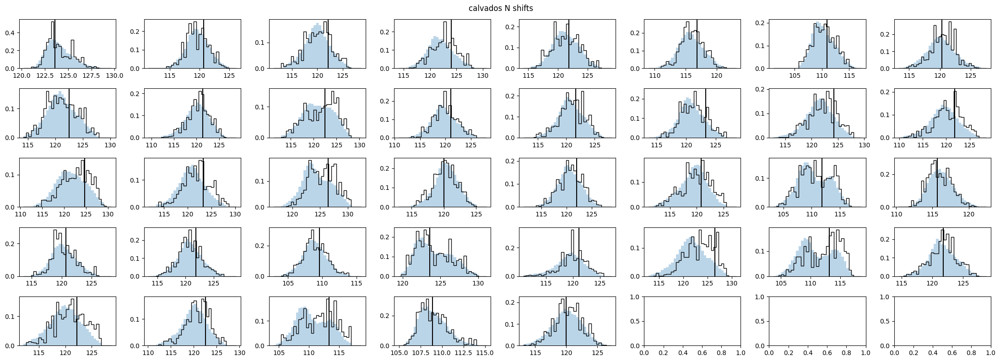

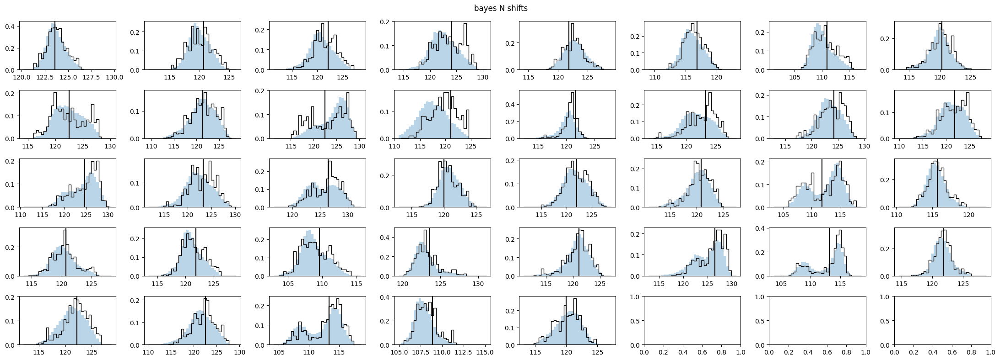

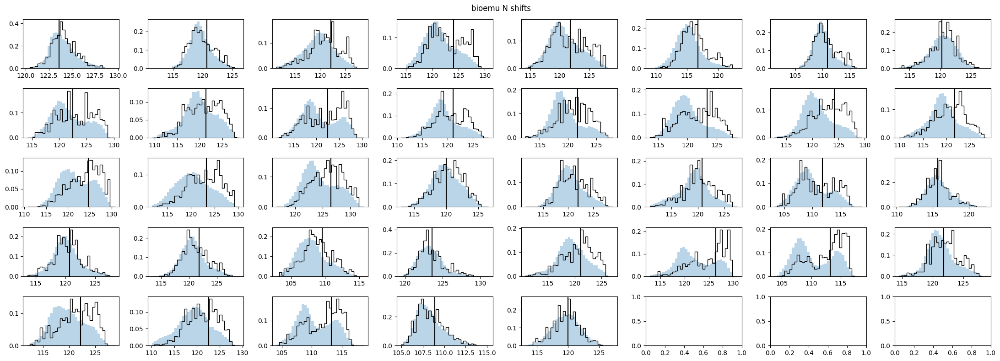

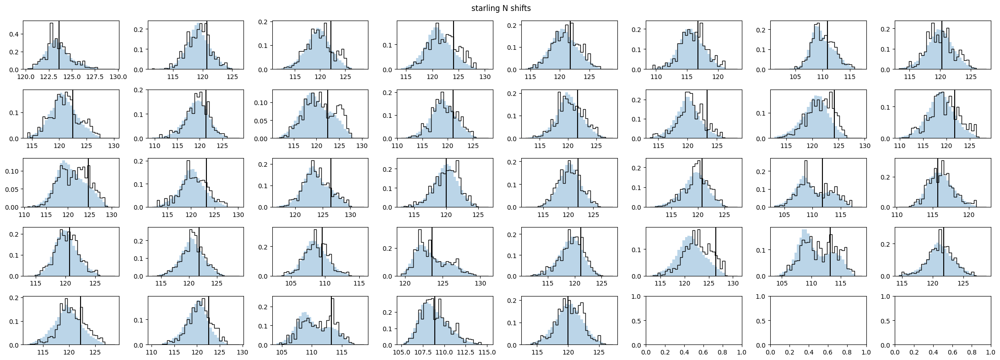

In [82]:
for obs_index, obs in enumerate(exp[0]):
    mins, maxes = get_minmax(exp, forwards, obs_index)
    for index, (name, weight) in enumerate(zip(names, weights)):
    
        fig, axes = plt.subplots(4 if len(exp[1][obs_index]) <= 32 else 5, 8,
                                 figsize=(22, 6 if len(exp[1][obs_index]) <= 32 else 8))
        
        fig.suptitle(f"{name} {obs} shifts")
        
        for j, k, min_, max_, ax in zip(forwards[index][1][obs_index], exp[1][obs_index], mins, maxes, axes.flat):
            ax.axvline(k, color='black', ls='-')
            l, filt = ci_filter(j, return_mask=True)
            ax.hist(l, alpha=.3, bins=35, range=(min_, max_+1), density=True)
            ax.hist(l, bins=35, range=(min_, max_+1), histtype='step', color='black', 
                    weights=weight[filt], density=True)
            
        fig.tight_layout()

Recomputing all RMSEs with code written entirely in the cell


double check rmse for  a99SB-disp
CA RMSE 0.20895674878804485
CB RMSE 0.1211655925589392
H RMSE 0.21256000279343684
HA RMSE 0.0445352687483526
N RMSE 0.5254307062629757


double check rmse for  CALVADOS
CA RMSE 0.16427931895697384
CB RMSE 0.17264780190497048
H RMSE 0.18473456030048682
HA RMSE 1.7612945919247627e-05
N RMSE 1.2121450709610964


double check rmse for  bAIes
CA RMSE 0.1972886742536746
CB RMSE 0.22307496576255412
H RMSE 0.18919514438450508
HA RMSE 0.09129282680105612
N RMSE 0.44133710266170667


double check rmse for  bioemu
CA RMSE 0.1938052680020002
CB RMSE 2.6671616220870462e-05
H RMSE 0.21442264764136867
HA RMSE 0.04014949672473925
N RMSE 0.7594137517328619


double check rmse for  STARLING
CA RMSE 0.09949785452863615
CB RMSE 0.03283946600144969
H RMSE 0.13344172911852276
HA RMSE 0.0018194654483490935
N RMSE 1.5857690164823999




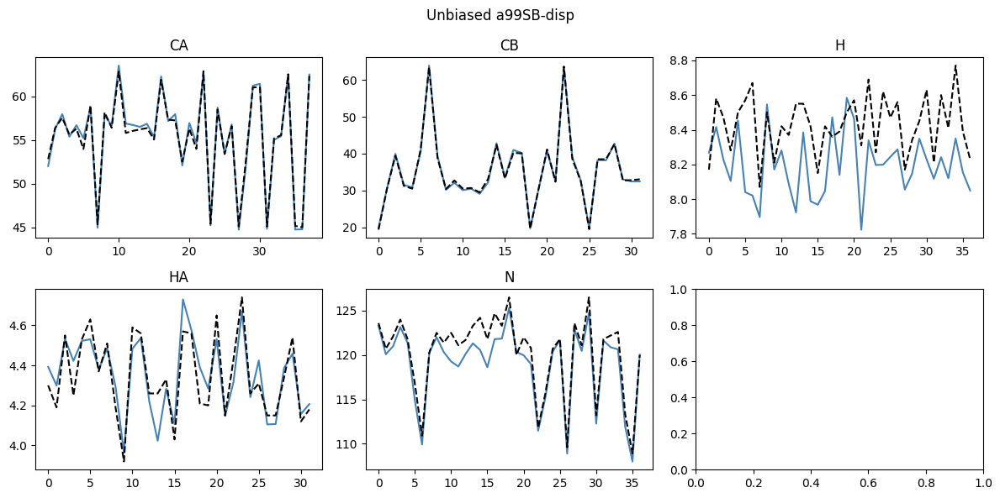

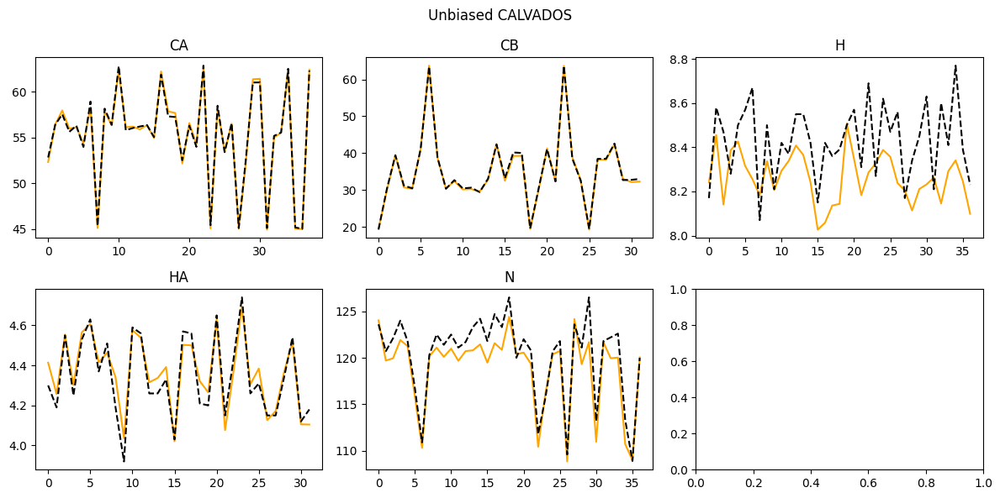

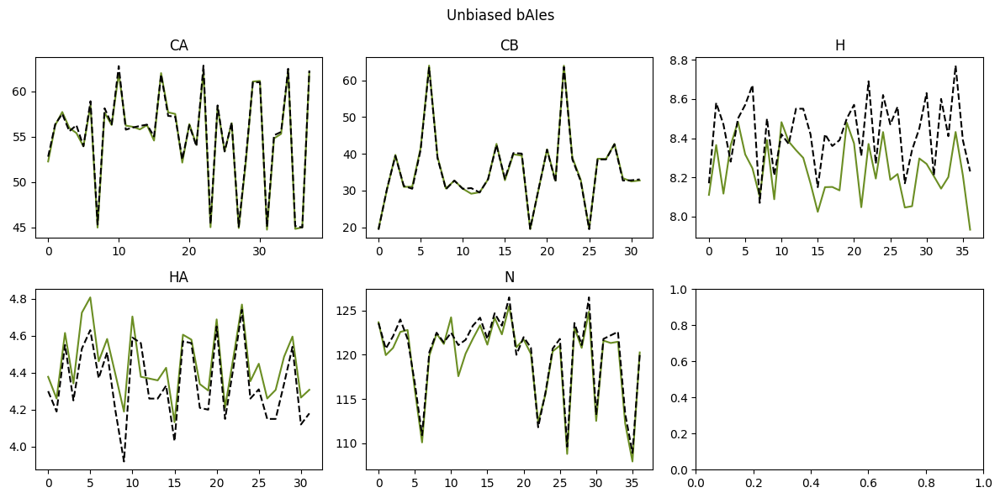

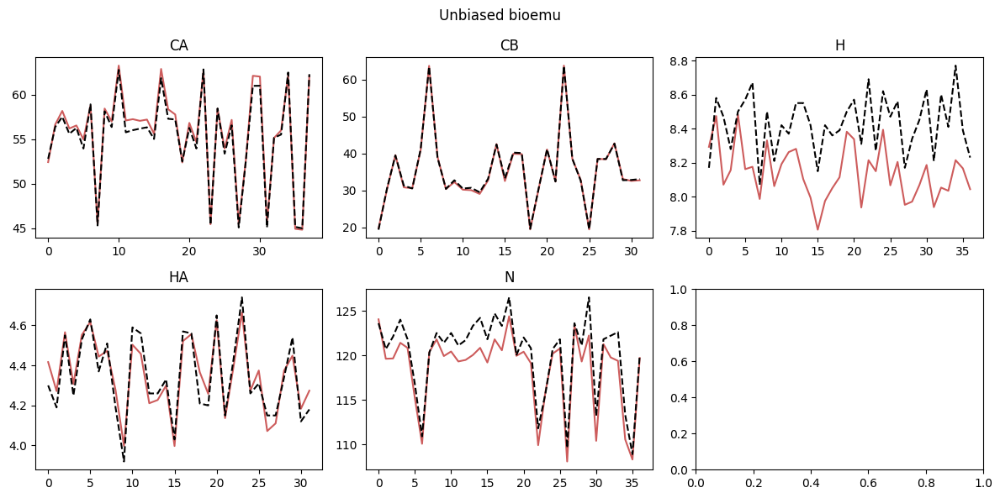

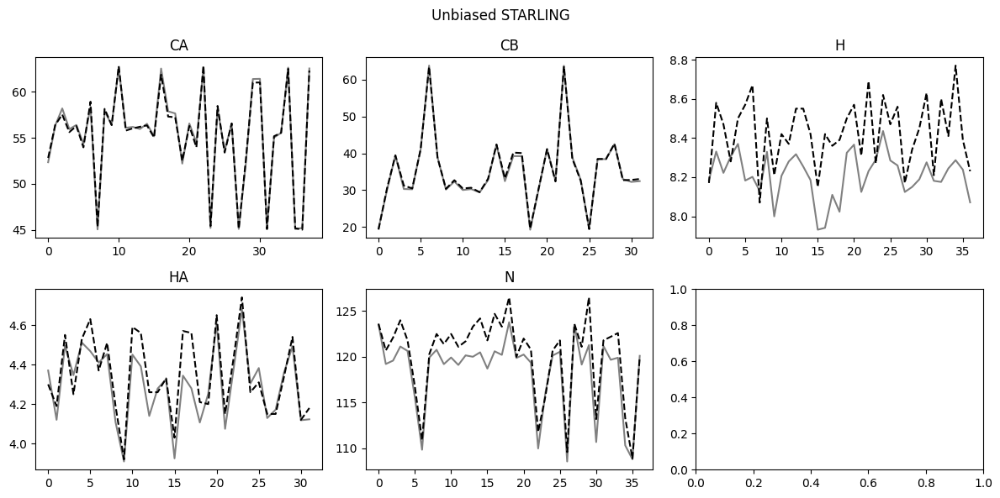

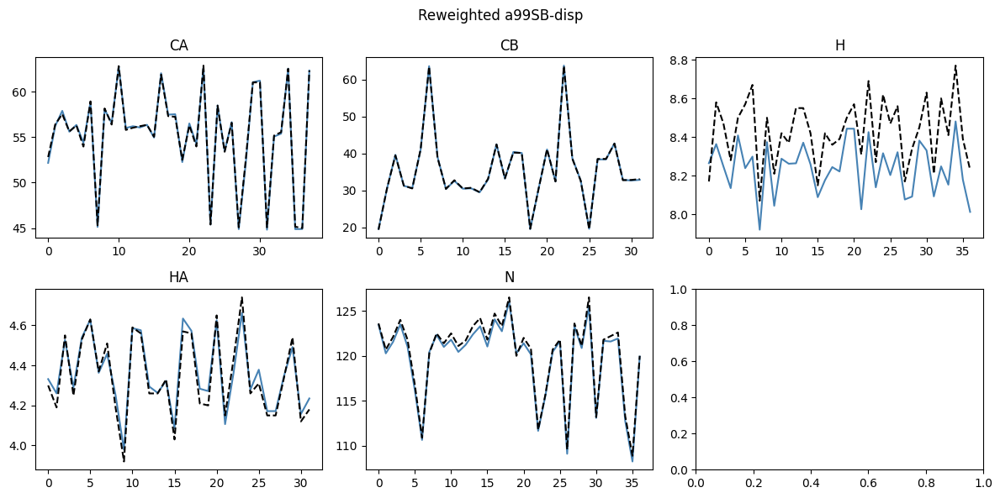

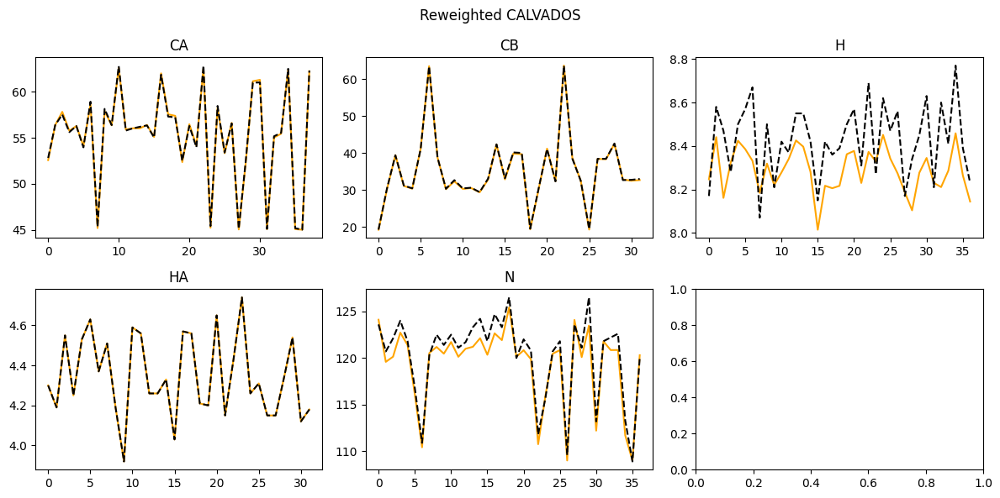

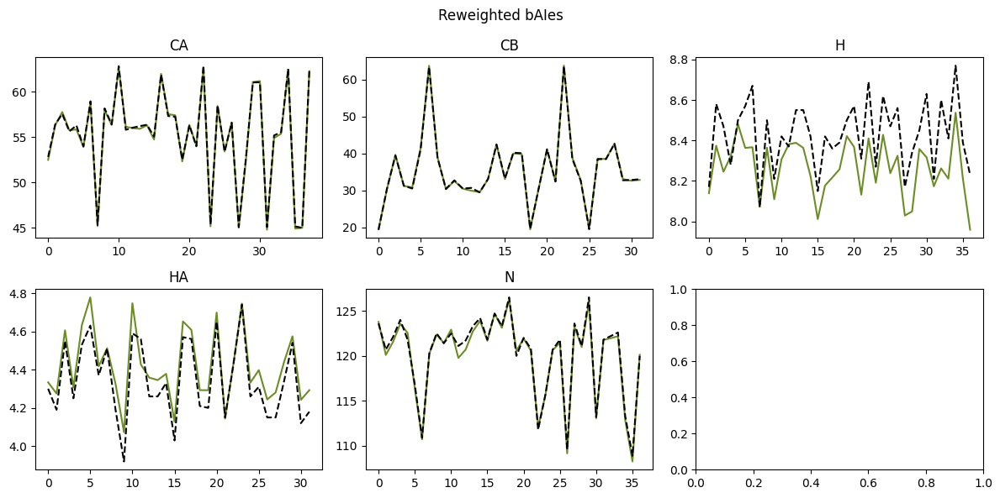

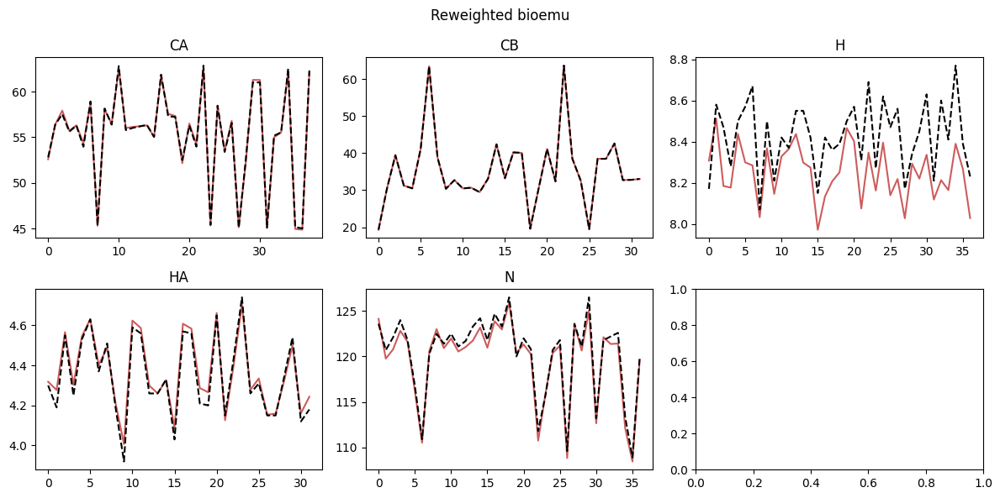

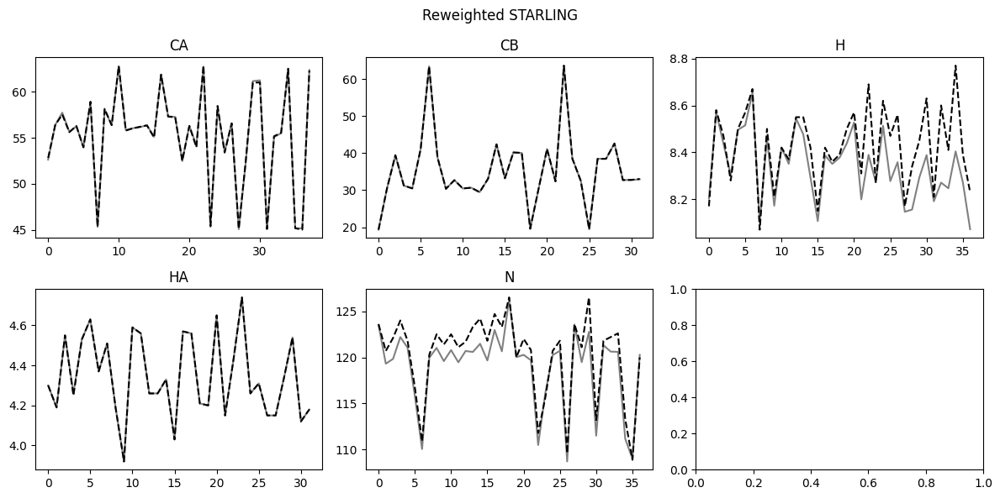

In [88]:

for (fi, color, label) in zip(forwards, colors, labels):
    fig, axes = plt.subplots(2, 3, figsize=(12, 6))
    for f, e, ax, obs in zip(fi[1], exp[1], axes.flat, exp[0]):
        ax.plot(f.mean(-1), color=color)
        ax.plot(e, color='black', ls='--')
        ax.set_title(obs)
    fig.suptitle('Unbiased ' + label)
    fig.tight_layout()

print('Recomputing all RMSEs with code written entirely in the cell\n\n')

for (fi, color, label, weight) in zip(forwards, colors, labels, weights):
    fig, axes = plt.subplots(2, 3, figsize=(12, 6))
    print('double check rmse for ', label)
    for f, e, ax, obs in zip(fi[1], exp[1], axes.flat, exp[0]):
        ax.plot(f @ weight.reshape(-1, 1), color=color)
        ax.plot(e, color='black', ls='--')
        ax.set_title(obs)
        print(obs, 'RMSE', np.mean((e - (f @ weight.reshape(-1, 1)).flatten()) ** 2) ** (1/2))
    fig.suptitle('Reweighted ' + label)
    fig.tight_layout()
    print('\n')
        
    
    

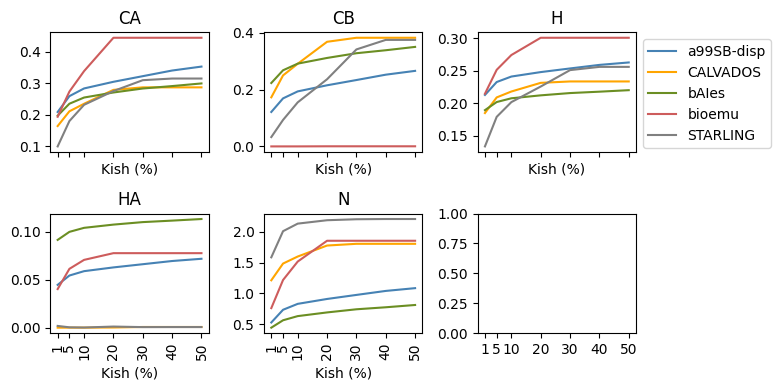

In [89]:
fig, axes = plt.subplots(2, 3, figsize=(8, 4), sharex=True)
for i, (ax, title) in enumerate(zip(axes.flat[:-1], exp[0])):
    for j, (color, label) in enumerate(zip(colors, labels)):
        
        ax.plot(kishes,
                matrices[:, i, j], color=color, label=label)
        
        ax.set_title(title)
        #ax.set_xscale("log")
        ax.set_xticks(np.array(kishes).astype(int))
        ax.set_xlabel('Kish (%)')
        
        if i == 2:
            ax.legend(bbox_to_anchor=[1,1])
        
        ax.tick_params(axis="x", labelrotation=90)

fig.tight_layout()


In [90]:
unbiased_matrix = np.stack([[rmse(f.mean(1), e) for f, e in zip(fi[1], exp[1])] for fi in forwards], 1)

<Axes: title={'center': 'Unbiased CS RMSDs'}, ylabel='NMR Chemical Shift'>

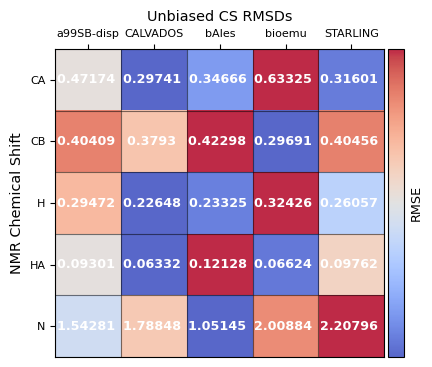

In [91]:
matrix = unbiased_matrix
color_matrix = (matrix -  matrix.min(1, keepdims=True)) / (matrix.max(1, keepdims=True) - matrix.min(1, keepdims=True))
annotated_matrix_plot(matrix,
                      color_matrix=color_matrix,
                      title = 'Unbiased CS RMSDs',
                      xlabel='',
                      ylabel="NMR Chemical Shift",
                      cbar_label='RMSE',
                      xticks=labels,
                      yticks=exp[0],
                      font_scale=.23,
                      figsize=(4.5,4), 
                      xticks_top=True,
                      cmap='coolwarm',
                      hide_cbar_ticks=True,
                      grid=True, decimals=5,
                      alpha=.85
                 )

<Axes: title={'center': 'Maximum Entropy Reweighting Results'}, ylabel='NMR Chemical Shift'>

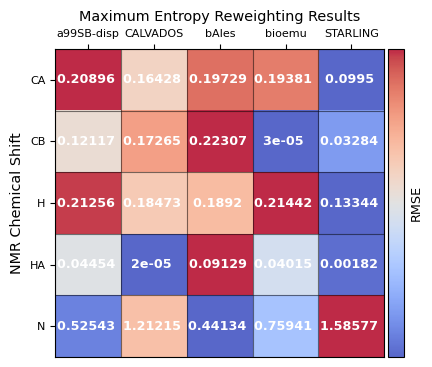

In [92]:
matrix = matrices[-1]
color_matrix = (matrix -  matrix.min(1, keepdims=True)) / (matrix.max(1, keepdims=True) - matrix.min(1, keepdims=True))
annotated_matrix_plot(matrix,
                      color_matrix=color_matrix,
                      title = 'Maximum Entropy Reweighting Results',
                      xlabel='',
                      ylabel="NMR Chemical Shift",
                      cbar_label='RMSE',
                      xticks=labels,
                      yticks=exp[0],
                      font_scale=.23,
                      figsize=(4.5,4), 
                      xticks_top=True,
                      cmap='coolwarm',
                      hide_cbar_ticks=True,
                      grid=True, decimals=5,
                      alpha=.85
                 )
                  

 ## Compute geometric descriptors

In [34]:

singular_values = []
sa = []
distances = []
rg = []
all_writhes = []
bending_energies = []
persistence = []
tccas = []
#fig, axes = plt.subplots(2, 3, figsize=(8, 4))
for l in (1, 3, 5):
    writhes = []
    bends = []
    persistence_l = []
    
    for traj, pdb, slice_, label in zip(trajs, pdbs, need_slice, labels):
        
        t = md.load(traj, top=pdb, atom_indices = md.load(pdb).top.select('name CA')
                    if slice_ else None).center_coordinates()
        
        # stride = round(t.n_frames / 10000)
        # print(stride)
        # t = t[::stride]
        # print(t.n_frames, t)
        
        writhe = Writhe(xyz=t.xyz)
        _=writhe.compute_writhe(l, cuda=True)
        writhes.append(writhe.writhe_features)
        
        bends.append(bending_energy(t.xyz, l=l))

        persistence_l.append(tangent_corr(t.xyz, l=l)[0])
        
        if l == 1:
            sa.append(np.pad(calc_sa(t, helix_pdb), (2, 3))[2:-3])
            print(sa[-1].shape)
            d = ResidueDistances(np.arange(t.xyz.shape[1]), t, periodic=False)
            distances.append(d.distances)
            rg.append(Rg(t.xyz))
            tcca = tCCA(writhes[-1], 10, 2)
            tccas.append(tcca.fit_transform())
            #writhe.plot_writhe_matrix(ax=ax)

            
        
    sigmas = [pca(i, scale = False)[1] for i in writhes]
    singular_values.append(sigmas)
    all_writhes.append(writhes)
    bending_energies.append(bends)
    persistence.append(persistence_l)
    print("finished")

fig.tight_layout()

lengths = np.fromiter(map(len, all_writhes[0]), int)

std_writhes = [np.array_split(standardize(np.concatenate(i, axis=0)),
                              np.cumsum(lengths)[:-1], axis=0) for i in all_writhes]


singular_values.append([pca(np.concatenate([i[j] for i in std_writhes], 1),
                            scale=False,
                            dask=False,
                            n_comp=11,
                            shift=True)[1]
                          for j in range(len(trajs))])



(29977, 40)


/home/t/writhe/Writhe_Package_Lite/src/writhe_tools/writhe.py:101: UserWarning: operator() profile_node %141 : int[] = prim::profile_ivalue(%new_shape.2)
 does not have profile information (Triggered internally at ../third_party/nvfuser/csrc/graph_fuser.cpp:104.)
  if isinstance(segments, (list, tuple)) else writhe_segments(xyz=xyz,


(20010, 40)
(20000, 40)
(25857, 40)
(30000, 40)
finished
finished
finished


In [96]:
writhe = Writhe(t.xyz)
writhe.compute_writhe(1, cuda=True)

{'length': 1,
 'n_points': 40,
 'n': 30000,
 'writhe_features': array([[-0.01106064, -0.00130284,  0.00071315, ...,  0.00277523,
         -0.00334398, -0.00214092],
        [ 0.02424893,  0.00776387,  0.00602371, ...,  0.01815596,
          0.00990605,  0.00714075],
        [-0.00318514, -0.00150883, -0.00055877, ...,  0.01120091,
         -0.00134834, -0.0033768 ],
        ...,
        [ 0.00493247,  0.00234877, -0.00025002, ...,  0.02902812,
          0.00884653,  0.01223714],
        [ 0.00208171,  0.00326181,  0.00381074, ...,  0.00079534,
         -0.00313834, -0.00536308],
        [ 0.00762346,  0.00293305, -0.00092361, ...,  0.00828776,
          0.01539331,  0.01148368]], dtype=float32),
 'segments': array([[ 0,  1,  2,  3],
        [ 0,  1,  3,  4],
        [ 0,  1,  4,  5],
        ...,
        [35, 36, 37, 38],
        [35, 36, 38, 39],
        [36, 37, 38, 39]])}

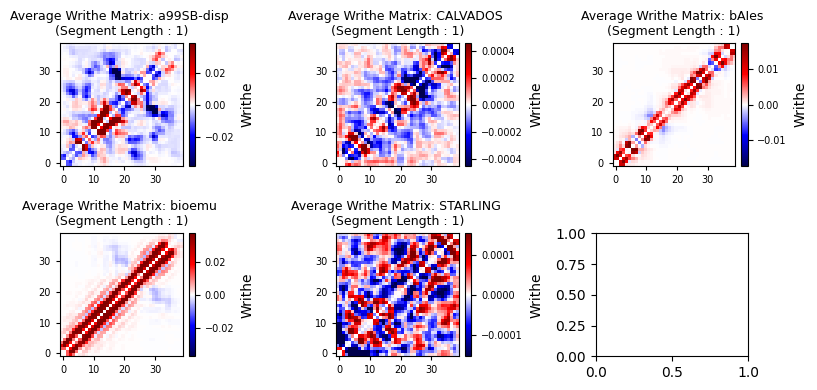

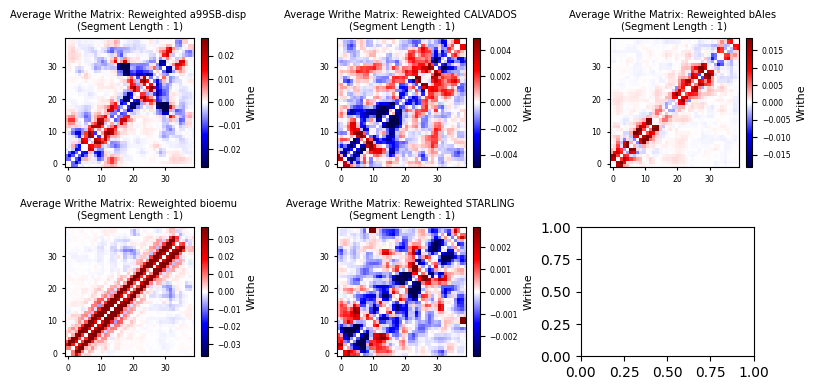

In [97]:
fig, axes = plt.subplots(2, 3, figsize=(8, 4))
for j, (wr, ax, label) in enumerate(zip(all_writhes[0], axes.flat, labels)):
    writhe.writhe_features = wr
    writhe.plot_writhe_matrix(ax=ax, dscr=label, laplacian=True, label_stride=10)
fig.tight_layout()

fig, axes = plt.subplots(2, 3, figsize=(8, 4))
for j, (wr, ax, weight, label) in enumerate(zip(all_writhes[0], axes.flat, weights, labels)):
    writhe.writhe_features = wr
    writhe.plot_writhe_matrix(ax=ax, dscr=f'Reweighted {label}', laplacian=True, 
                              label_stride=10, weights=weight.astype(np.float32), font_scale=.8)
fig.tight_layout()
    

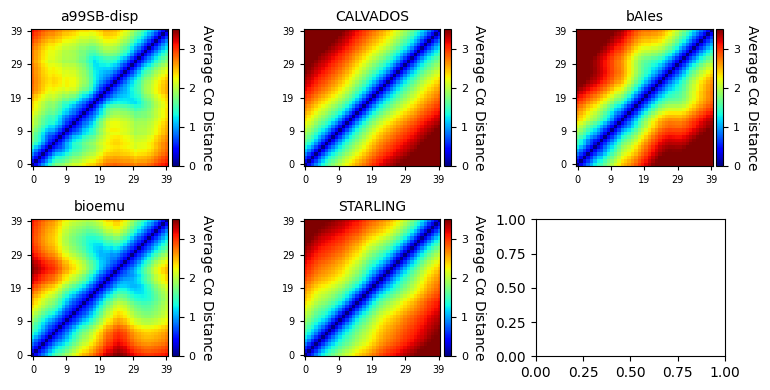

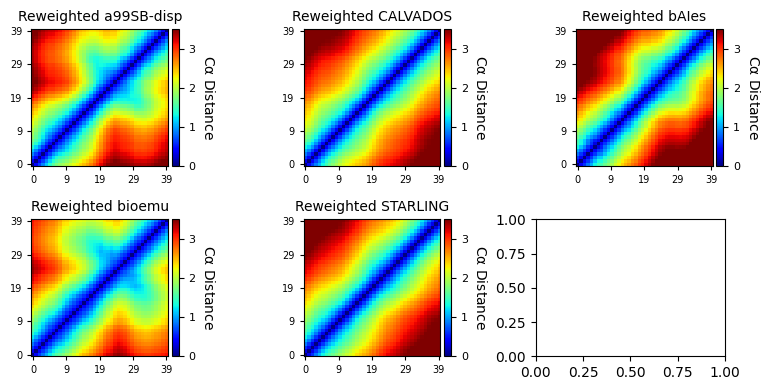

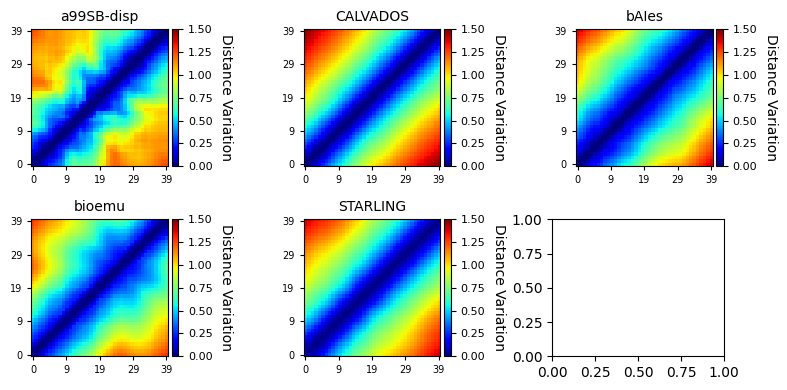

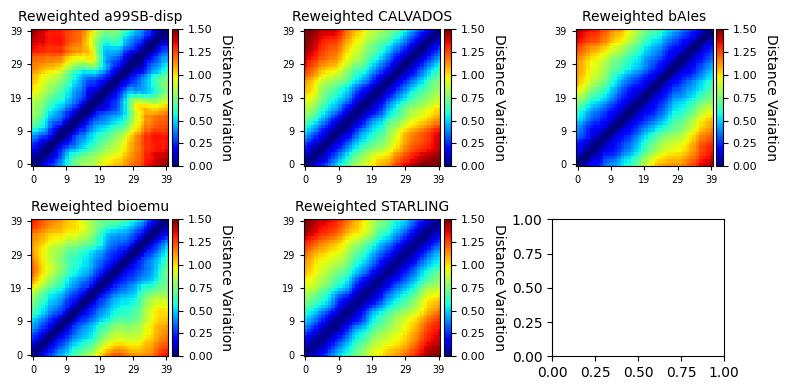

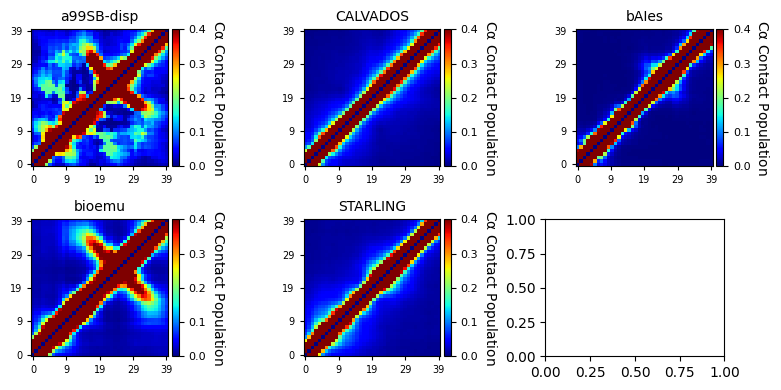

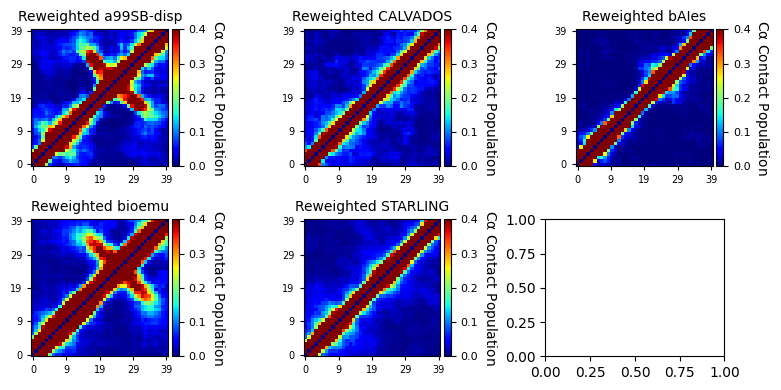

In [98]:
fig, axes = plt.subplots(2, 3, figsize=(8, 4))
for d, label, ax in zip(distances, labels, axes.flat):
    plot_distance_matrix(to_distance_matrix(d.mean(0), t.n_residues),
                         ax=ax,
                         title=label,
                         label_stride=7,
                         cbar_label=r'Average C$\alpha$ Distance',
                         vmin=0, vmax=3.5
                        )
fig.tight_layout() 

fig, axes = plt.subplots(2, 3, figsize=(8, 4))
for d, label, weight, ax in zip(distances, labels, weights, axes.flat):
    plot_distance_matrix(to_distance_matrix(mean(d, weight), t.n_residues),
                         ax=ax,
                         title='Reweighted '+label,
                         label_stride=7,
                         cbar_label=r'C$\alpha$ Distance',
                         vmin=0, vmax=3.5
                        )
fig.tight_layout() 

fig, axes = plt.subplots(2, 3, figsize=(8, 4))
for d, label, ax in zip(distances, labels, axes.flat):
    plot_distance_matrix(to_distance_matrix(d.std(0), t.n_residues),
                         ax=ax,
                         title=label,
                         label_stride=7,
                         cbar_label=r'Distance Variation',
                         vmin=0, vmax=1.5
                        )
fig.tight_layout() 

fig, axes = plt.subplots(2, 3, figsize=(8, 4))
for d, label, weight, ax in zip(distances, labels, weights, axes.flat):
    plot_distance_matrix(to_distance_matrix(std(d, weight), t.n_residues),
                         ax=ax,
                         title='Reweighted '+label,
                         label_stride=7,
                         cbar_label=r'Distance Variation',
                         vmin=0, vmax=1.5
                        )
fig.tight_layout() 

fig, axes = plt.subplots(2, 3, figsize=(8, 4))
for d, label, ax in zip(distances, labels, axes.flat):
    plot_distance_matrix(to_distance_matrix(to_contacts(d, 1).mean(0), t.n_residues),
                         ax=ax,
                         title=label,
                         label_stride=7,
                         cbar_label=r'C$\alpha$ Contact Population',
                         vmin=0, vmax=.4
                        )
fig.tight_layout() 

fig, axes = plt.subplots(2, 3, figsize=(8, 4))
for d, label, weight, ax in zip(distances, labels,  weights, axes.flat):
    plot_distance_matrix(to_distance_matrix(mean(to_contacts(d, 1), weight), t.n_residues),
                         ax=ax,
                         title='Reweighted '+label,
                         label_stride=7,
                         cbar_label=r'C$\alpha$ Contact Population',
                         vmin=0, vmax=.4
                        )
fig.tight_layout() 

 ## Visualize fluctuations of writhe + alpha helix in unbiased ensembles

/home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pyblock/blocking.py:256: RuntimeWarning: invalid value encountered in scalar divide
  if B3 > 2*ndata*(var_std_err/std_err_first[i])**4:
/home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pyblock/blocking.py:256: RuntimeWarning: invalid value encountered in scalar divide
  if B3 > 2*ndata*(var_std_err/std_err_first[i])**4:
/home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pyblock/blocking.py:256: RuntimeWarning: invalid value encountered in scalar divide
  if B3 > 2*ndata*(var_std_err/std_err_first[i])**4:
/home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pyblock/blocking.py:256: RuntimeWarning: invalid value encountered in scalar divide
  if B3 > 2*ndata*(var_std_err/std_err_first[i])**4:
/home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/pyblock/blocking.py:256: RuntimeWarning: invalid value encountered in scalar divide
  if B3 > 2*ndata*(var_std_err/std_err_first[i])**4:


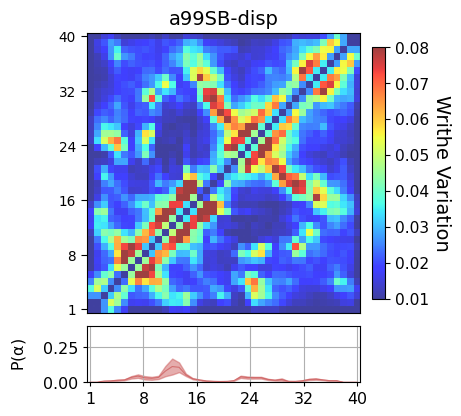

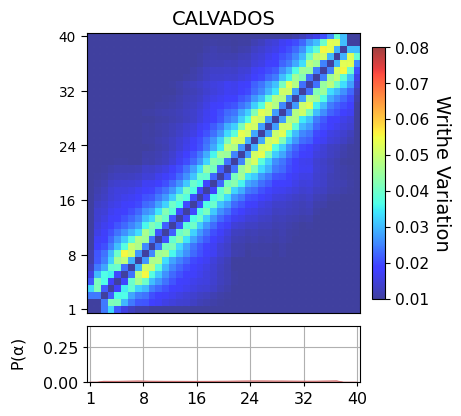

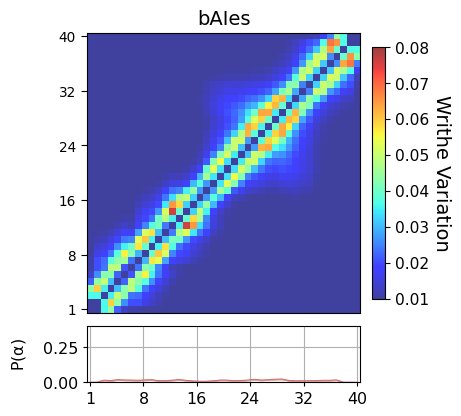

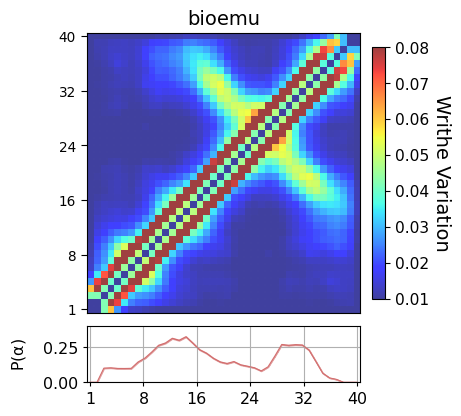

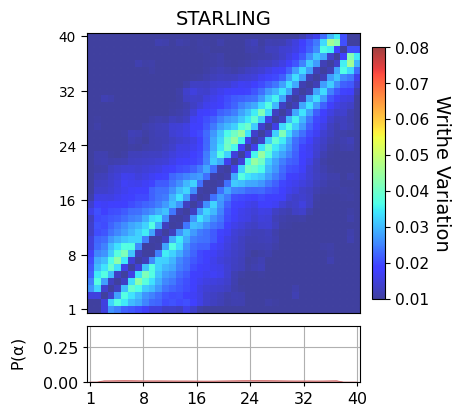

In [38]:


line_plot_args = dict(
                     label_stride=6,
                     color='indianred',
                     ymax = .4,
                     ylabel=r"P($\alpha$)",
                     ylabel_rotation = 90,
                     lw=.8,
                     grid=True,
                     alpha=.75,
                     fill_alpha=.5, 
                     fill_color='indianred',
                     font_scale=.2, xticks=np.arange(1, t.n_residues + 1)
    
                      )

matrix_plot_args = dict(grid=True,
                        grid_alpha=.1,
                        grid_linewidth = .05,
                        grid_color='lightgray',
                        label_stride=6,
                        vmax=0.08,
                        vmin=0.01,
                        cmap='jet',
                        alpha = .75,
                        xticks = np.arange(1, t.n_residues+1),
                        yticks = np.arange(1, t.n_residues+1),
                        cbar_label=r'Writhe Variation',
                        font_scale=1.5
                        #figsize=()
                        
                 )

for writhe, helix, label in zip(all_writhes[0], sa, labels):
    matrix_plot_args.update(dict(matrix=to_laplacian(writhe).std(0), title=label))
    mu, err = block_error(helix, True)
    line_plot_args.update(dict(y=mu, y1=err[0], y2=err[1]))
    # if label == 'bioemu':
    #     ym = line_plot_args['ymax']
    #     line_plot_args['ymax'] = 1
    #     build_grid_plot(matrix_plot_args, line_plot_args)
    #     line_plot_args['ymax'] = ym
    # else:
    build_grid_plot(matrix_plot_args, line_plot_args)


In [39]:
proj = pca(np.concatenate([np.concatenate(i) for i in std_writhes], 1))[0]

In [40]:
frames = sample_split(np.arange(len(sample_labels)))

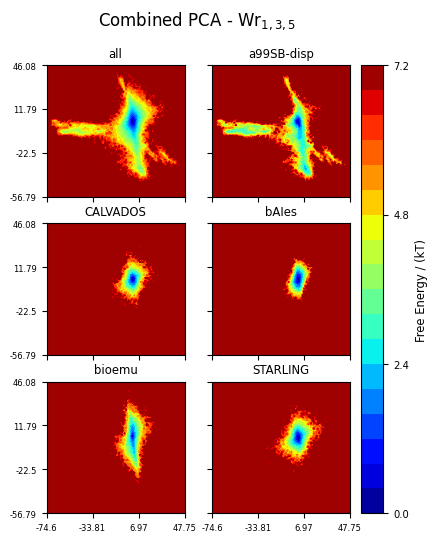

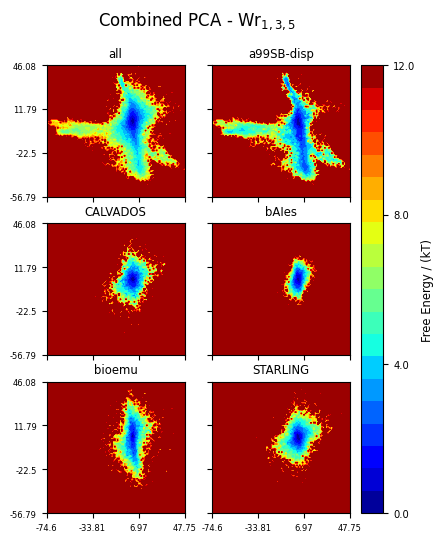

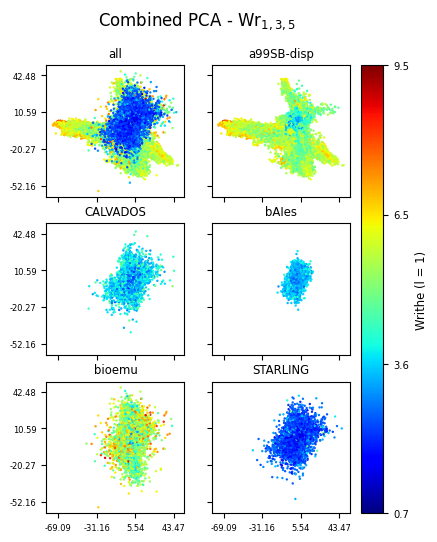

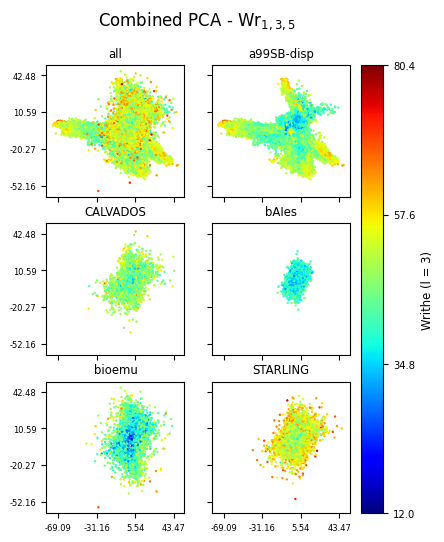

In [41]:
from writhe_tools.plots import fes2d, proj2d, subplots_fes2d

subplots_fes2d(proj[:, :2], 3, 2, ['all'] + labels, [np.arange(len(sample_labels))] + frames,
               figsize=(4, 7), sharey=True, sharex=True, n_contours=20, 
               title=r"Combined PCA - $Wr_{1, 3, 5}$", title_pad=.9
               #contour_lines=True, 
               #alpha_lines=.3, alpha_contours=.6, bins=40, cmap='coolwarm'
              )
subplots_fes2d(proj[:, :2], 3, 2, ['all'] + labels, [np.arange(len(sample_labels))] + frames,
               figsize=(4, 7), sharey=True, sharex=True, n_contours=20, 
               title=r"Combined PCA - $Wr_{1, 3, 5}$", title_pad=.9, weights_list=[np.concatenate(weights)] + weights
               #contour_lines=True, 
               #alpha_lines=.3, alpha_contours=.6, bins=40, cmap='coolwarm'
              )
subplots_proj2d(proj[:, :2], 
                [abs(np.concatenate(all_writhes[0])).sum(-1)]+[abs(i).sum(-1) for i in all_writhes[0]],
                3, 2, ['all'] + labels, [np.arange(len(sample_labels))] + frames,
               figsize=(4, 7), sharey=True, sharex=True, 
               title=r"Combined PCA - $Wr_{1, 3, 5}$", title_pad=-.1,cbar_label='Writhe (l = 1)'
               #contour_lines=True, 
               #alpha_lines=.3, alpha_contours=.6, bins=40, cmap='coolwarm'
              )

subplots_proj2d(proj[:, :2], 
                [abs(np.concatenate(all_writhes[1])).sum(-1)]+[abs(i).sum(-1) for i in all_writhes[1]],
                3, 2, ['all'] + labels, [np.arange(len(sample_labels))] + frames,
               figsize=(4, 7), sharey=True, sharex=True, 
               title=r"Combined PCA - $Wr_{1, 3, 5}$", title_pad=-.1, cbar_label='Writhe (l = 3)'
               #contour_lines=True, 
               #alpha_lines=.3, alpha_contours=.6, bins=40, cmap='coolwarm'
              )
#plt.tight_layout()

#fig, axes = plt.subplots(3, 2, figsize=(6, 2))
#fes2d(proj[:, :2], ax=axes[0], tick_decimals=1)


    

# proj2d(proj[:, :2], c=sample_labels, state_map=True, ax=axes[1], tick_decimals=1)
# fig.tight_layout()

Text(0.5, 1.08, 'Writhe (l=1) tCCA')

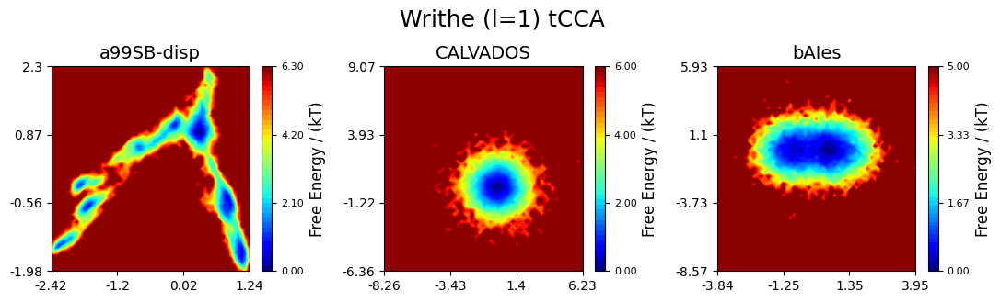

In [42]:
tccas = reindex_list(tccas, [0, 1, 2])
fig, axes = plt.subplots(1, 3, figsize=(11, 3))
for ax, i, label in zip(axes.flat, tccas, labels):
    fes2d(i, n_contours=55, bins=55, title=label, ax=ax, mask=False)
plt.tight_layout()
fig.suptitle('Writhe (l=1) tCCA', size=18, y=1.08)


# tccas = reindex_list(tccas, [0, 1, 2])
# fig, axes = plt.subplots(1, 3, figsize=(11, 3))
# for j, (ax, i, label) in enumerate(zip(axes.flat, all_writhes, labels)):
#     fes2d(tCCA(np.concatenate([w[j] for w in all_writhes[:2]], 1), 10, 2).fit_transform(),
#                n_contours=65, bins=55, title=label, ax=ax, mask=False)
# plt.tight_layout()
# fig.suptitle('Writhe (l=1, 3) tCCA', size=18, y=1.08)


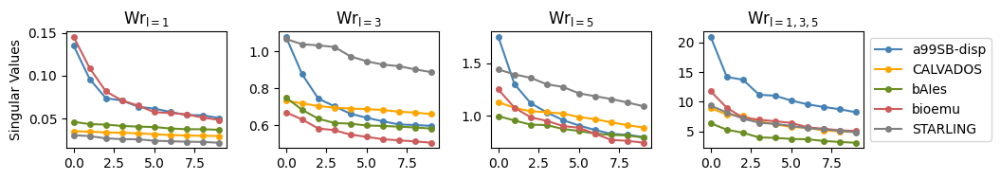

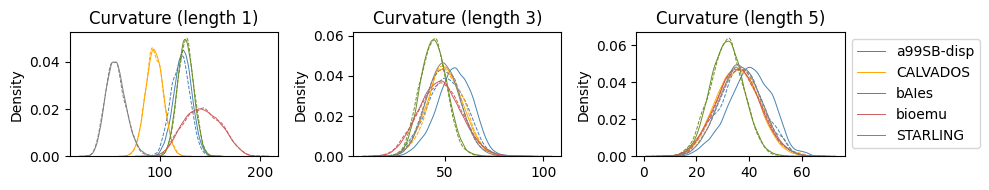

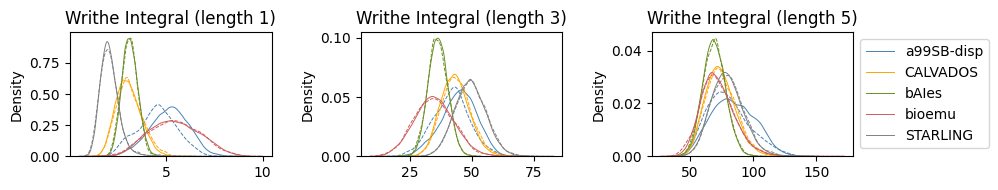

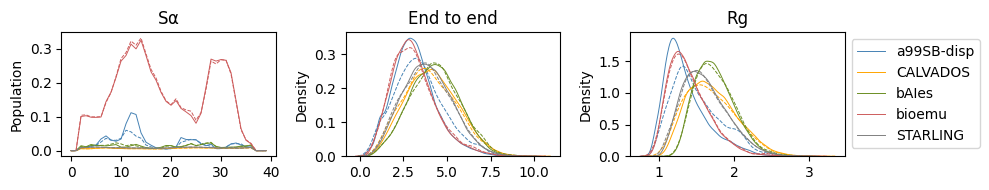

In [43]:
figsize = (10,2)

lw = .7
fig, axes = plt.subplots(1, 4, figsize=(10.66, 2), sharey=False, sharex=True)
for i, ax, length in zip(singular_values, axes.flat, "1,3,5".split(',') + 2 * ['1,3,5']):
    for j, label, color in zip(i, labels, colors):
        ax.plot(j[:10], label=label, marker='o', ms=4, color=color)
        ax.set_title(rf'$Wr_{{l={length}}}$')

axes[0].set_ylabel('Singular Values')
ax.legend(bbox_to_anchor=[1,1])
fig.tight_layout()            


fig, axes = plt.subplots(1, 3, figsize=figsize, sharey=False, sharex=False)
for i, ax, length in zip(bending_energies, axes.flat, "1,3,5".split(',')):
    for j, label, color, weight in zip(i, labels, colors, weights):
        kdeplot(j, label=label, ax=ax, color=color, lw=lw)
        kdeplot(x=j,  ax=ax, weights=weight, color=color, ls='--', lw=lw)
    ax.set_title(f'Curvature (length {length})')

ax.legend(bbox_to_anchor=[1,1])
fig.tight_layout()            


fig, axes = plt.subplots(1, 3, figsize=figsize, sharey=False, sharex=False)
for i, ax, length in zip(all_writhes, axes.flat, "1,3,5".split(',')):
    for j, label, color, weight in zip(i, labels, colors, weights):
        kdeplot(abs(j).sum(-1), label=label, ax=ax, color=color, lw=lw)
        kdeplot(x=abs(j).sum(-1), ax=ax, weights=weight, color=color, ls='--', lw=lw)
    ax.set_title(rf'Writhe Integral (length {length})')

ax.legend(bbox_to_anchor=[1,1])
fig.tight_layout()


fig, axes = plt.subplots(1, 3, figsize=figsize)
for i, label, color, weight in zip(sa, labels, colors, weights):
    axes[0].plot(i.mean(0), label=label,  lw=lw, color=color)
    axes[0].plot(mean(i, weights=weight, ax=0), lw=lw, color=color, ls='--')
axes[0].set_title(r'S$\alpha$')
axes[0].set_ylabel('Population')

for i, label, color,  weight in zip([i[:, t.xyz.shape[1] - 2] for i in distances], labels, colors, weights):
    kdeplot(i, label=label, common_grid=True, ax=axes[1],  lw=lw, color=color)
    kdeplot(x=i, ax=axes[1], weights=weight, lw=lw, ls='--', color=color)
axes[1].set_title(r'End to end')

for i, label, color, weight in zip(rg, labels, colors, weights):
    kdeplot(i, label=label, common_grid=True, ax=axes[2], lw=lw, color=color)
    kdeplot(x=i, common_grid=True, ax=axes[2], weights=weight, lw=lw, color=color, ls='--')
axes[2].set_title(r'Rg')
axes[2].legend(bbox_to_anchor=[1,1])
fig.tight_layout()

In [ ]:
 ## END RESULTS - code for other observables is below

s, residue_indices = get_residues(trj)
codes = "".join([trj.top.residue(i).code for i in residue_indices])

In [235]:
from writhe_tools.utils import product

def compute_pre(traj,
                tag_idx,
                periodic: bool = True,
                #fill_zeros: bool = False,
                print_pairs: bool = False,
               ):

    """
    function to compute PREs for labeled residues (tag_idx), uses zero indexing, fills zeros 
    """
    
    residue_indices = get_residues(traj)[-1]
    h_indices = np.array([traj.top.select(f'resid {i} and name H').item() for i in residue_indices])
    ca_indices = np.array([traj.top.select(f'resid {i} and name CA').item() for i in residue_indices])
    
    pairs = np.concatenate([product([ca_indices[i]], h_indices) for i in tag_idx])

    
    if print_pairs:
        print(np.array([(traj.top.atom(i), traj.top.atom(j)) for i, j in pairs]))
        
    d = md.compute_distances(traj.center_coordinates() if not periodic else traj,
                             pairs,
                             periodic=periodic)

    b=18.8; k=1.23e-32; tdelay=0.010; R2exp=4.0; b=18.8; tc=4.0e-9; wH=2.6752e8*b*2.0*np.pi
    # calculate PRE
    d = k*np.power(d,-6)*(4.0*tc+3.0*tc/(1.0+(wH*tc)**2))*1.0e42
    # calculate Iratios
    d = (R2exp*np.exp(-tdelay * d) / (d + R2exp)).reshape(traj.n_frames,
                                                          len(tag_idx),
                                                          len(residue_indices)).transpose(1, 2, 0)

    
    d[np.arange(len(tag_idx)), tag_idx] = 0

    return d



def compute_rdc_pales(
    traj,
    pales_exec: str = '/data/pales/linux/pales',
    *,
    window: int = 7,
    amide_H_name: str = "H",
    amide_N_name: str = "N",
    skip_ends: bool = True,
    n_jobs: int = 1,
    backend: str = "threading",
    extra_pales_args: tuple[str, ...] = (),
    keep_tmp: bool = False,
    tmp_dir: str | None = None,
):
    """
    PALES sliding-window RDCs, parallelized over frames:
      - 1 job computes all RDCs for 1 frame
      - many frames run concurrently via joblib

    Robust to messy residue numbering by:
      - selecting "legit" residues via 'protein and name CA'
      - slicing trajectory to those residues only
      - writing per-frame PDB and renumbering residues to 0..nres_legit-1
      - generating PALES -inD internally using those 0-based ids
    """
    import os
    import tempfile
    import subprocess
    import numpy as np
    from joblib import Parallel, delayed
    from writhe_tools.md_tools import get_residues

    sequence, residue_indices = get_residues(traj)
    assert len(residue_indices) > 1, 'No residues with CAs found'
    residue_indices_set = set(residue_indices.tolist())
    
    atom_indices = np.array([a.index for a in traj.top.atoms if a.residue.index in residue_indices_set], dtype=int)
    if atom_indices.size == 0:
        raise ValueError("No atoms found for legit residues (unexpected).")

    traj_sliced = traj.atom_slice(atom_indices)
    code_seq = "".join([traj.top.residue(i).code for i in residue_indices])
    res_names = [traj.top.residue(i).name for i in residue_indices]
    

    # centers in 0..nres_legit-1 space
    if skip_ends:
        if len(residue_indices) < 3:
            raise ValueError("skip_ends=True requires at least 3 legit residues.")
        labels = np.arange(1, len(residue_indices) - 1, dtype=int)
    else:
        labels = np.arange(0, len(residue_indices), dtype=int)

    # precompute r1/rN in this 0-based resid space
    r1_arr = np.empty(labels.size, dtype=int)
    rN_arr = np.empty(labels.size, dtype=int)
    for k, i in enumerate(labels):
        w = min(int(window), int(i), int((len(residue_indices) - 1) - i))
        r1_arr[k] = int(i - w)
        rN_arr[k] = int(i + w)

    # format DATA SEQUENCE (spaces every 10)
    blocks = [code_seq[i:i + 10] for i in range(0, len(code_seq), 10)]
    data_sequence_line = "DATA SEQUENCE " + " ".join(blocks)

    # --- workspace ---
    tmpobj = tempfile.TemporaryDirectory(prefix="pales_", dir=tmp_dir)
    root = tmpobj.name

    try:
        # Write PALES -inD ONCE (0-based residue ids 0..nres_legit-1)
        inD_path = os.path.join(root, "PALES_input.dat")
        with open(inD_path, "w") as f:
            f.write(data_sequence_line + "\n\n")
            f.write("VARS   RESID_I RESNAME_I ATOMNAME_I RESID_J RESNAME_J ATOMNAME_J D      DD    W\n")
            f.write("FORMAT %5d     %6s       %6s        %5d     %6s       %6s    %9.3f   %9.3f %.2f\n\n")
            for new_id, r3 in enumerate(res_names):
                f.write(f"{new_id:d} {r3:>3s} {amide_H_name} {new_id:d} {r3:>3s} {amide_N_name} 0 1.00 1.00\n")

        # renumber a PDB's resSeq to 0.. per residue transition
        def renumber_pdb_to_zero_based(in_pdb: str, out_pdb: str):
            last_key = None
            resid = -1
            with open(in_pdb, "r") as fin, open(out_pdb, "w") as fout:
                for line in fin:
                    if line.startswith(("ATOM  ", "HETATM")):
                        chain = line[21]
                        resseq = line[22:26]
                        icode = line[26]
                        key = (chain, resseq, icode)
                        if key != last_key:
                            resid += 1
                            last_key = key
                        line = line[:22] + f"{resid:4d}" + line[26:]
                    fout.write(line)

        # one job = one frame: compute all centers serially
        def one_frame(t: int):
            frame_dir = os.path.join(root, f"frame_{t}")
            os.makedirs(frame_dir, exist_ok=True)

            pdb_raw = os.path.join(frame_dir, "frame_raw.pdb")
            pdb_clean = os.path.join(frame_dir, "frame_clean.pdb")

            traj_sliced[t].save_pdb(pdb_raw)
            renumber_pdb_to_zero_based(pdb_raw, pdb_clean)

            vals = np.empty(labels.size, dtype=float)

            for k, center in enumerate(labels.tolist()):
                outD_path = os.path.join(frame_dir, f"out_c{int(center)}.tbl")

                cmd = [
                    pales_exec, "-stPales",
                    "-inD", inD_path,
                    "-pdb", pdb_clean,
                    "-r1", str(int(r1_arr[k])),
                    "-rN", str(int(rN_arr[k])),
                    "-outD", outD_path,
                ]
                if extra_pales_args:
                    cmd.extend(list(extra_pales_args))

                p = subprocess.run(cmd, capture_output=True, text=True)
                if p.returncode != 0:
                    raise RuntimeError(
                        f"PALES failed on frame={t}, center={int(center)}\n"
                        f"cmd: {' '.join(cmd)}\n"
                        f"stdout:\n{p.stdout}\n"
                        f"stderr:\n{p.stderr}\n"
                    )

                val = None
                with open(outD_path, "r") as f:
                    for line in f:
                        parts = line.strip().split()
                        if len(parts) == 12 and parts[0].replace(".", "", 1).lstrip("-").isdigit():
                            if float(parts[0]) == float(center):
                                val = float(parts[8])
                                break
                if val is None:
                    raise ValueError(f"Could not find RDC for center resid={int(center)} in {outD_path}")

                vals[k] = val

                if not keep_tmp:
                    try:
                        os.remove(outD_path)
                    except OSError:
                        pass

            if not keep_tmp:
                for pth in (pdb_raw, pdb_clean):
                    try:
                        os.remove(pth)
                    except OSError:
                        pass
                try:
                    os.rmdir(frame_dir)
                except OSError:
                    pass

            return t, vals

        # run (parallel over frames)
        n_frames = traj_sliced.n_frames
        rdc = np.empty((labels.size, n_frames), dtype=float)

        if n_jobs == 1:
            for t in range(n_frames):
                _, vals = one_frame(t)
                rdc[:, t] = vals
        else:
            results = Parallel(n_jobs=n_jobs, backend=backend)(
                delayed(one_frame)(t) for t in range(n_frames)
            )
            for t, vals in results:
                rdc[:, t] = vals

        return labels, rdc

    finally:
        if keep_tmp:
            print(f"[PALES] kept temp dir: {root}")
        else:
            tmpobj.cleanup()


    

#compute_pre(trj, [1, 30 , 38], True).shape

from writhe_tools.utils import Timer
with Timer():
    
    rdc = compute_rdc_pales(trj, n_jobs=24)
    

Time elapsed : 1778.508709192276 s


In [240]:
for t, p, name in zip(trajs_all, pdbs_all, names):
    save_dict(f'{obs_path}/{name}_rdc.pkl', [compute_rdc_pales(md.load(t, top=p))])

/home/t/miniconda3/envs/writhe/lib/python3.10/site-packages/mdtraj/formats/pdb/pdbfile.py:200: UserWarning: Unlikely unit cell vectors detected in PDB file likely resulting from a dummy CRYST1 record. Discarding unit cell vectors.
  warnings.warn('Unlikely unit cell vectors detected in PDB file likely '
